In [39]:
import os
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import keras
import pickle
import latex

from more_itertools import sort_together

from IPython.display import Markdown, display

from keras import backend as K
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.initializers import Ones, Zeros, Constant, RandomNormal
from keras.models import Model, load_model
from keras.layers import Dense, Input, Lambda, concatenate, SimpleRNN, Reshape, RepeatVector, PReLU, BatchNormalization, LeakyReLU
from keras.losses import mse
from keras.constraints import non_neg

In [40]:
# Change presentation settings

%matplotlib inline

matplotlib.rcParams["figure.figsize"] = (16.0, 10.0)

#matplotlib.rcParams['font.family'] = 'sans-serif'
#matplotlib.rcParams['font.sans-serif'] = ['Liberation Sans']

matplotlib.rcParams["axes.spines.left"] = True
matplotlib.rcParams["axes.spines.top"] = True
matplotlib.rcParams["axes.spines.right"] = True
matplotlib.rcParams["axes.spines.bottom"] = True
matplotlib.rcParams["axes.labelsize"] = 14
matplotlib.rcParams["axes.titlesize"] = 18

matplotlib.rcParams["xtick.top"] = True
matplotlib.rcParams["ytick.right"] = True
matplotlib.rcParams["xtick.direction"] = "in"
matplotlib.rcParams["ytick.direction"] = "in"
matplotlib.rcParams["xtick.labelsize"] = 10
matplotlib.rcParams["ytick.labelsize"] = 10
matplotlib.rcParams["xtick.major.size"] = 10
matplotlib.rcParams["ytick.major.size"] = 10
matplotlib.rcParams["xtick.minor.size"] = 5
matplotlib.rcParams["ytick.minor.size"] = 5
matplotlib.rcParams["xtick.minor.visible"] = True

#matplotlib.rcParams["text.usetex"] = True

matplotlib.rcParams["lines.linewidth"] = 2

matplotlib.rcParams["legend.fontsize"] = 14

color_palette = {"Indigo": {
                    50: "#E8EAF6",
                    100: "#C5CAE9",
                    200: "#9FA8DA",
                    300: "#7986CB",
                    400: "#5C6BC0",
                    500: "#3F51B5",
                    600: "#3949AB",
                    700: "#303F9F",
                    800: "#283593",
                    900: "#1A237E"},
                 "Orange": {      
                    50: "#FFF3E0",
                    100: "#FFE0B2",
                    200: "#FFCC80",
                    300: "#FFB74D",
                    400: "#FFA726",
                    500: "#FF9800",
                    600: "#FB8C00",
                    700: "#F57C00",
                    800: "#EF6C00",
                    900: "#E65100"}
                }

line_styles = [(0, ()), (0, (1, 2)), (0, (3, 2))]

In [41]:
def plot_inputs(samples,lumi,pileup):
    inputs = []
    for i in range(len(samples)):
        for j in range(num_rates):
            if i == 0:
                inputs.append([])
                inputs[j].append(samples[i][WINDOW*j])
            elif i == len(samples)-1:
                for val in samples[i][WINDOW*j:WINDOW+WINDOW*j]:
                    inputs[j].append(val)
            else:
                inputs[j].append(samples[i][WINDOW*j])

    display(Markdown("<h2>Displaying Inputs</h2>"))
            
    plt.figure()
    fig,ax=plt.subplots()
    for r in range(len(inputs)):
        #print(len(lumi),len(inputs[r]))
        ax.scatter(lumi,inputs[r],label=labels[r])
    ax.legend(loc='lower left', bbox_to_anchor= (1.01, 0), ncol=1, 
                  borderaxespad=0, frameon=False)
    plt.xlabel('lumi id')
    plt.ylabel('rate/pileup')

    plt.figure()
    fig,ax=plt.subplots()
    for r in range(len(inputs)):
        ax.scatter(pileup,inputs[r],label=labels[r])
    ax.legend(loc='lower left', bbox_to_anchor= (1.01, 0), ncol=1, 
                  borderaxespad=0, frameon=False)
    plt.xlabel('pileup')
    plt.ylabel('rate/pileup')
    plt.show()

In [42]:
def plot_relerror(num_rates,x,lumi,reconstructed,error):
    error_reformat = []
    max_error = []
    inp = []
    outp = []
    for i in range(num_rates):
        error_reformat.append([])
        inp.append([])
        outp.append([])
        
    display(Markdown("<h2>Plotting Errors</h2>"))

    for i in range(len(error)):
        for j in range(num_rates):
            if i == len(error)-1:
                for val in error[i][WINDOW*j:WINDOW+WINDOW*j]:
                    error_reformat[j].append(val)
            else:
                error_reformat[j].append(error[i][WINDOW*j])
            
    plt.figure(figsize=[15,10])
    for i in range(len(error_reformat)):
        plt.subplot(2,3,i+1)
        minimum = min(error_reformat[i])
        maximum = max(error_reformat[i])
        bin_width = .02
        if maximum-minimum >= .1:
            #print(minimum, maximum)
            bins = np.linspace(minimum,maximum,int((maximum-minimum)/bin_width))
        else:
            print('AUTO BINNING')
            bins = np.linspace(-1,1,20)
        plt.hist(error_reformat[i],bins=bins,label=labels[i],alpha=.8)
        plt.title(labels[i])
        plt.xlim(-1.1,1.1)
        plt.xlabel(relativeerror)
    plt.tight_layout()

    plt.figure(figsize=[15,10])
    mins = []
    maxes = []
    for err in error_reformat:
        mins.append(min(err))
        maxes.append(max(err))
    bins = np.linspace(min(mins),max(maxes),50)
    for i in range(len(error_reformat)):
        plt.hist(error_reformat[i],bins=bins,label=labels[i],alpha=.8)
    plt.title('Relative Error Per HLT Part')
    plt.xlabel(relativeerror)
    plt.legend()
    plt.tight_layout()

    #lumi = np.linspace(0,len(error_reformat0]),len(error_reformat0]))
    plt.figure(figsize=[15,10])
    for i in range(num_rates):
        plt.subplot(2,3,i+1)
        plt.scatter(lumi,error_reformat[i],label=labels[i],alpha=.8)
        plt.xlabel('lumi id')
        plt.ylabel('error')
        plt.title(labels[i])  
        plt.ylim(-1,1)
    plt.tight_layout()


    plt.show()

In [43]:
def plot_inputvsoutput(num_rates,x,reconstructed,error,lumi,pileup):
    inp = []
    outp = []
    for i in range(num_rates):
        inp.append([])
        outp.append([])

    for i in range(len(error)):
        for j in range(num_rates):
            if i == len(error)-1:
                for val in reconstructed[i][WINDOW*j:WINDOW+WINDOW*j]:
                    outp[j].append(val)
                #print(WINDOW*j,WINDOW+WINDOW*j)
                for val in x[i][WINDOW*j:WINDOW+WINDOW*j]:
                    inp[j].append(val)
            else:
                outp[j].append(reconstructed[i][WINDOW*j])
                inp[j].append(x[i][WINDOW*j])
    
    display(Markdown("<h2>Plotting Inputs vs Outputs</h2>"))

    plt.figure(figsize=[15,10])
    for i in range(num_rates):
        plt.subplot(2,3,i+1)
        plt.plot(outp[i],inp[i],label=labels[i], linestyle='',marker='o', markersize=3, alpha=0.8)
        #plt.scatter(lumi,outp[i],label='output',alpha=.5)
        plt.xlabel('output')
        plt.ylabel('input')
        plt.title(labels[i])
        plt.axis('square')
        plt.xlim(0,1)
        plt.ylim(0,1)

    plt.figure(figsize=[20,10])
    for i in range(num_rates):
        plt.subplot(2,3,i+1)
        plt.plot(lumi,inp[i],label='Input', linestyle='',marker='o', markersize=5)
        plt.plot(lumi,outp[i],label='Output', linestyle='',marker='^',markersize=5,alpha=1)
        plt.title(labels[i])
        plt.xlabel('Lumi ID')
        plt.ylabel('Rate/Pileup')
        #plt.xlim(0,.5)
        #plt.ylim(0,5)
        plt.legend()    
    plt.tight_layout()


    plt.tight_layout()
    plt.show()
    
    output_rates = []
    input_rates = []

    for r in range(num_rates):
        output_rates.append([])
        input_rates.append([])

    for r in range(len(inp[0])):
        for o in range(num_rates):
            output_rates[o].append(inp[o][r]*pileup[r])
            input_rates[o].append(outp[o][r]*pileup[r])

    plt.figure(figsize=[15,10])

    for i in range(num_rates):
        plt.subplot(2,3,i+1)
        plt.scatter(pileup,input_rates[i],label='Input',alpha=1)
        plt.scatter(pileup,output_rates[i],label='Output',alpha=.5)
        plt.xlabel('pileup')
        plt.ylabel('rate')
        plt.title(labels[i])
        plt.legend()
        #plt.ylim(0,45)

    plt.tight_layout()

    plt.show()

In [44]:
def analyze_run(model_name,runnum):
    
    display(Markdown("<h1>" + runnum + "</h1>"))
    
    model = load_model("%s.h5" % (model_name))
    
    samples = np.array(good_data[runnum]['samplesWindow'])
    lumi_train = good_data[runnum]['lumiid']
    pileup = good_data[runnum]['pileup']
    pileup_train = np.array(good_data[runnum]['pileupInput'])
    
    if len(samples) >= 100:
    
        # Look at inputs
        plot_inputs(samples,lumi_train,pileup)

        # Generate predictions
        reconstructed_train = model.predict(samples)
        error = (samples-reconstructed_train)/(abs(samples)+abs(reconstructed_train))

        # Plot errors
        plot_relerror(num_rates,samples,lumi_train,reconstructed_train,error)

        # Look at Input vs Output
        plot_inputvsoutput(num_rates,samples,reconstructed_train,error,lumi_train,pileup)

In [45]:
def analyze_era(era,data):
    
    display(Markdown("<h1>" + era + "</h1>"))
    
    model_name = str(era) + "WINDOW"
    
    # Define the architecture

    _input = Input(shape=(6*WINDOW,), name="input")

    middle = Dense(3*WINDOW,
                   kernel_initializer=Ones(),
                   bias_initializer=Zeros(),
                   kernel_constraint=non_neg(),
                   bias_constraint=non_neg(),
                   activation = 'relu',
                   name="middle")(_input)

    norm = BatchNormalization()(middle)

    hidden = Dense(3,
                   kernel_initializer=Ones(),
                   bias_initializer=Zeros(),
                   kernel_constraint=non_neg(),
                   bias_constraint=non_neg(),
                   activation = 'relu',
                   name="encoded")(norm)

    normhidden = BatchNormalization()(hidden)

    middle2 = Dense(3*WINDOW,
                   kernel_initializer=Ones(),
                   bias_initializer=Zeros(),
                   kernel_constraint=non_neg(),
                   bias_constraint=non_neg(),
                   activation = 'relu',
                   name="middle2")(normhidden)

    normmiddle = BatchNormalization()(middle2)

    output = Dense(6*WINDOW,
                   kernel_initializer=Ones(),
                   bias_initializer=Zeros(),
                   kernel_constraint=non_neg(),
                   bias_constraint=non_neg(),
                   activation=None,
                   name="reconstructed")(normmiddle)

    normout = BatchNormalization()(output)

    model = Model(_input, normout)
    model.summary()
    
    runlength = []
    runs_by_era = []
    for run in good_data['Eras'][era]:
        runlength.append(len(good_data[run]['lumiid']))
        runs_by_era.append(run)
    
    if len(runs_by_era) > 1:
        print(runlength, runs_by_era)
        runlength, runs_by_era = sort_together([runlength,runs_by_era])
        print(runlength, runs_by_era)
        n = len(runlength)-1
        
        x_train = np.array(good_data[runs_by_era[n]]['samplesWindow'])
        pileup_train = np.array(good_data[runs_by_era[n]]['pileupInput'])
        x_val = np.array(good_data[runs_by_era[n-1]]['samplesWindow'])
        pileup_val = np.array(good_data[runs_by_era[n-1]]['pileupInput'])
    
        history = train_nn(model, x_train, pileup_train, 1024, "mse", model_name, x_val, pileup_val).history
        plot_loss(history)
        
        for run in runs_by_era:
            analyze_run(model_name,run)
        
        

In [46]:
def compare_good_bad(era,good_data,bad_data):
    
    model = load_model("%s.h5" % (era+"WINDOW"))

    error_reformat = []
    for n in range(num_rates):
        error_reformat.append([])

    for run in good_data["Eras"][era]:
        samples = np.array(good_data[run]['samplesWindow'])
        lumi_train = good_data[run]['lumiid']
        pileup = good_data[run]['pileup']
        pileup_train = np.array(good_data[run]['pileupInput'])
        
        if len(samples) >= 100:
            # Generate predictions
            reconstructed_train = model.predict(samples)
            error = (samples-reconstructed_train)/(abs(samples)+abs(reconstructed_train))

            for i in range(len(error)):
                for j in range(num_rates):
                    if i == len(error)-1:
                        for val in error[i][WINDOW*j:WINDOW+WINDOW*j]:
                            error_reformat[j].append(val)
                    else:
                        error_reformat[j].append(error[i][WINDOW*j])
                    
    error_reformat_bad = []
    for n in range(num_rates):
        error_reformat_bad.append([])

    for run in bad_data["Eras"][era]:
        try:
            samples = np.array(bad_data[run]['samplesWindow'])
            lumi_train = bad_data[run]['lumiid']
            pileup = bad_data[run]['pileup']
            pileup_train = np.array(bad_data[run]['pileupInput'])
            
            # Generate predictions
            reconstructed_train = model.predict(samples)
            error = (samples-reconstructed_train)/(abs(samples)+abs(reconstructed_train))

            for i in range(len(error)):
                for j in range(num_rates):
                    if i == len(error)-1:
                        for val in error[i][WINDOW*j:WINDOW+WINDOW*j]:
                            error_reformat_bad[j].append(val)
                    else:
                        error_reformat_bad[j].append(error[i][WINDOW*j])
        except:
            continue
                    
    plt.figure(figsize=[15,10])
    for i in range(len(error_reformat)):
        plt.subplot(2,3,i+1)
        minimum = min(error_reformat[i])
        maximum = max(error_reformat[i])
        bin_width = .02
        if maximum-minimum >= .1:
            #print(minimum, maximum)
            bins = np.linspace(minimum,maximum,int((maximum-minimum)/bin_width))
        else:
            bins = np.linspace(-1,1,20)
        plt.hist(error_reformat[i],bins=bins,label='Good Data',alpha=.8,color='g')
        if len(error_reformat_bad[i]) > 0:
            minimum = min(error_reformat_bad[i])
            maximum = max(error_reformat_bad[i])
            bin_width = .02
            if maximum-minimum >= .1:
                #print(minimum, maximum)
                bins = np.linspace(minimum,maximum,int((maximum-minimum)/bin_width))
            else:
                bins = np.linspace(-1,1,20)
            plt.hist(error_reformat_bad[i],bins=bins,label='Bad Data',alpha=.8,color='r')
        plt.title(labels[i])
        plt.xlim(-1.1,1.1)
        plt.xlabel(relativeerror)
        plt.legend()
    plt.tight_layout()
    plt.show()

In [47]:
def plot_loss(data, save_name=False):
    """Plots the training and validation loss"""
    fig, ax = plt.subplots()

    plt.xlabel("Epoch", horizontalalignment='right', x=1.0)
    plt.ylabel("Cross-entropy", horizontalalignment='right', y=1.0)

    plt.plot(data["loss"], linestyle=line_styles[0], color=color_palette["Indigo"][800])
    plt.plot(data["val_loss"], linestyle=line_styles[2], color=color_palette["Orange"][400])
    plt.legend(["Training data set", "Validation data set"], loc="upper right", frameon=False)
    plt.yscale("log")
    
    if save_name:
        fig.savefig("%s/%s.eps" % (figure_export_directory, save_name), bbox_inches="tight")

    plt.show();

In [48]:
def train_nn(model, x, y, batch_size, loss, name, xval, pval):
    
    adam = keras.optimizers.Adam(lr=0.003,
                                 beta_1=0.9,
                                 beta_2=0.999,
                                 epsilon=None,
                                 decay=0.0,
                                 amsgrad=False)

    early_stopper = EarlyStopping(monitor="val_loss",
                                  patience=32,
                                  verbose=True,
                                  mode="auto")

    reduce_lr = ReduceLROnPlateau(monitor="val_loss",
                                  factor=0.1,
                                  patience=24)
    
    checkpoint_callback = ModelCheckpoint(("%s.h5" % (name)),
                                          monitor="val_loss",
                                          verbose=False,
                                          save_best_only=True,
                                          mode="min")
    
    model.compile(loss=loss, optimizer=adam)
    
    history = model.fit(x, x,
                     batch_size=batch_size,
                     epochs=1000,
                     verbose=2,
                     initial_epoch=0,
                     shuffle=True,
                     validation_data=(xval,xval),
                     callbacks=[early_stopper, checkpoint_callback])
    return history

## Data

In [49]:
WINDOW = 15

good_data_file = "Pileup_"+str(WINDOW)+"_data.pickle"
bad_data_file = "Pileup_"+str(WINDOW)+"_bad.pickle"

subplot_size = [2,3]
fig_size = [20,20]

with open(good_data_file, 'rb') as handle:
    good_data = pickle.load(handle)
with open(bad_data_file, 'rb') as handle:
    bad_data = pickle.load(handle)

In [50]:
runlength = []
badrunlength = []
numruns = []
eras = []
runs_by_era = []
bad_runs_by_era = []
i = -1
for era in good_data['Eras']:
    runlength.append([])
    badrunlength.append([])
    runs_by_era.append([])
    bad_runs_by_era.append([])
    eras.append(era)
    i += 1
    j = 0
    for run in good_data['Eras'][era]:
        runlength[i].append(len(good_data[run]['lumiid']))
        runs_by_era[i].append(run)
        j+=1
    for run in bad_data['Eras'][era]:
        try:
            badrunlength[i].append(len(bad_data[run]['lumiid']))
            bad_runs_by_era[i].append(run)
        except:
            continue
    numruns.append(j)
    
m = numruns.index(max(numruns))
m=9
n = runlength[m].index(max(runlength[m]))
a = badrunlength[m].index(max(badrunlength[m]))

print(eras[m],runs_by_era[m][n])
print(eras[m],runs_by_era[m][n-1])
print(eras[m],bad_runs_by_era[m][a])
print(eras[m],bad_runs_by_era[m][a+2])

x_train = np.array(good_data[runs_by_era[m][n]]['samplesWindow'])
pileup_train = np.array(good_data[runs_by_era[m][n]]['pileupInput'])
x_test = np.array(good_data[runs_by_era[m][n-1]]['samplesWindow'])
pileup_test = np.array(good_data[runs_by_era[m][n-1]]['pileupInput'])
x_val = np.array(good_data[runs_by_era[m][n+1]]['samplesWindow'])
pileup_val = np.array(good_data[runs_by_era[m][n+1]]['pileupInput'])
x_bad1 = np.array(bad_data["302975"]['samplesWindow'])
pileup_bad1 = np.array(bad_data["302975"]['pileupInput'][0])
x_bad2 = np.array(bad_data["302995"]['samplesWindow'])
pileup_bad2 = np.array(bad_data["302995"]['pileupInput'])

num_rates = int(len(x_train[0])/WINDOW)
print(num_rates)
print(badrunlength[m])


eraV310 304144
eraV310 304125
eraV310 302975
eraV310 302995
6
[52, 23, 12, 4, 120, 27, 21, 27, 243, 56, 54, 55, 218, 583, 151, 284, 2, 46, 4, 9, 9, 203, 28, 79, 35, 29]


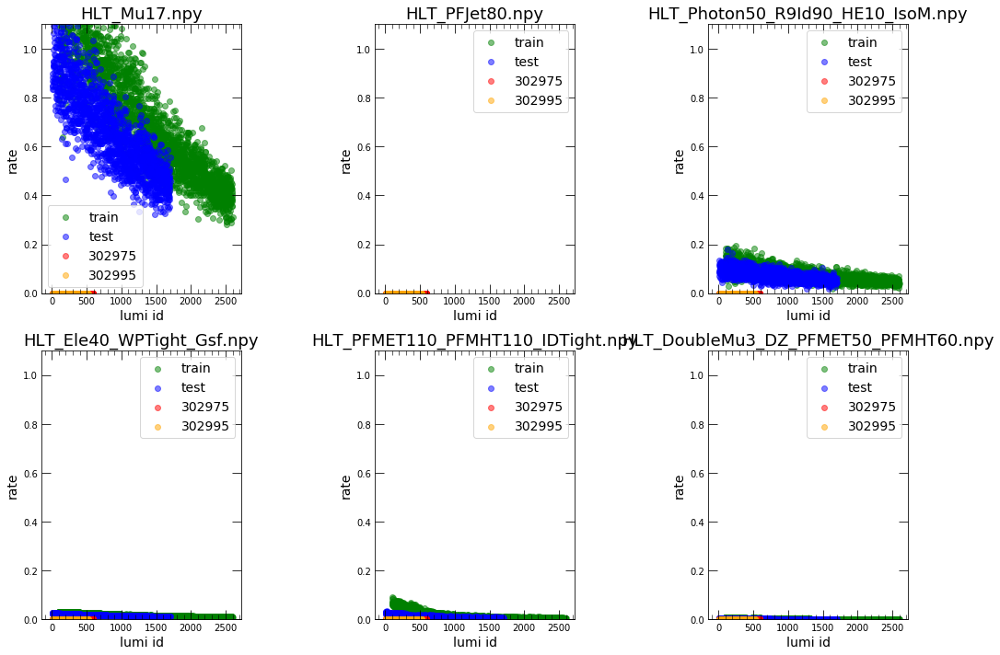

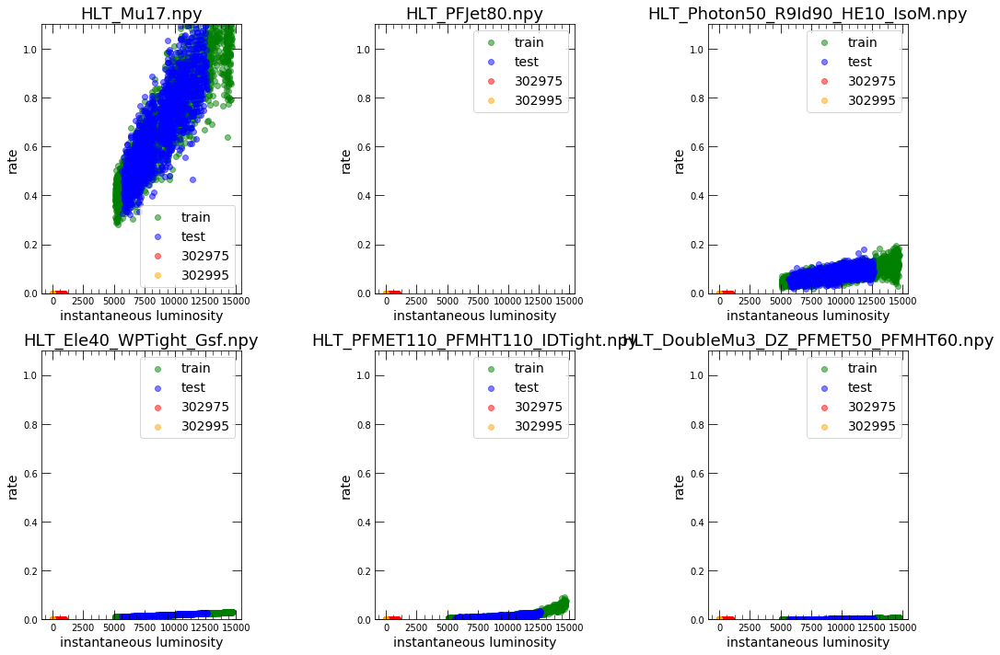

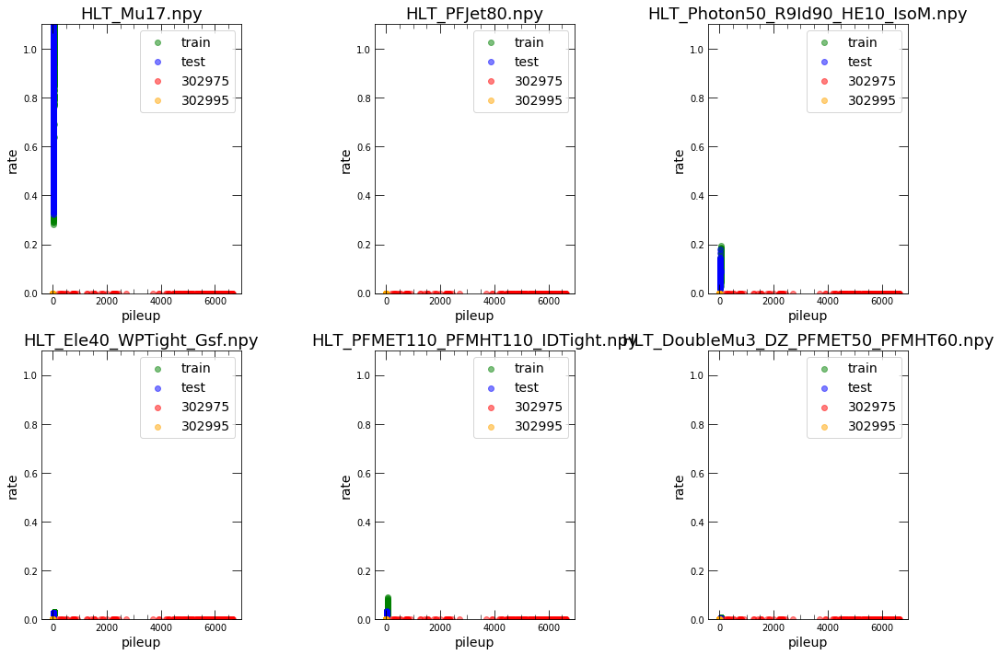

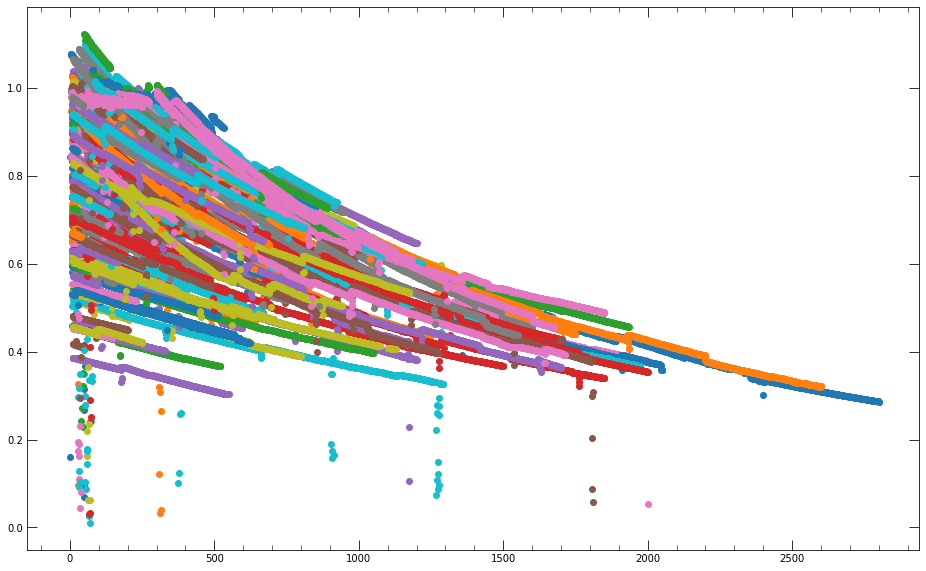

In [51]:
relativeerror = r"$\frac{input rate - output rate}{|input rate| + |output rate|}$"
sumsquareddif = r"$\sum_{i} (input rate_i-output rate_i)^2$"

plots = [x_train,x_test,x_bad1,x_bad2]
titles = ["train","test","302975","302995"]

stuff = [[],[],[],[]]
lumi = [[],[],[],[]]
inst = [[],[],[],[]]
pileup = [[],[],[],[]]
for h in range(4):
    if h == 0:
        lumi[h] = good_data["304144"]['lumiid']
        inst[h] = good_data["304144"]['instlumi']
        pileup[h] = good_data["304144"]['pileup']
        stuff[h] = good_data["304144"]['rates']
    elif h == 1:
        lumi[h] = good_data["304125"]['lumiid']
        inst[h] = good_data["304125"]['instlumi']
        pileup[h] = good_data["304125"]['pileup']
        stuff[h] = good_data["304125"]['rates']
    elif h == 2:
        lumi[h] = bad_data["302975"]['lumiid']
        inst[h] = bad_data["302975"]['instlumi']
        pileup[h] = bad_data["302975"]['pileup']
        stuff[h] = bad_data["302975"]['rates']
    else:
        lumi[h] = bad_data["302995"]['lumiid']
        inst[h] = bad_data["302995"]['instlumi']
        pileup[h] = bad_data["302995"]['pileup']
        stuff[h] = bad_data["302995"]['rates']
    
labels = good_data['HLT'] 
colors = ["g","b","r","orange"]
    
plt.figure(figsize=[15,10])
for i in range(num_rates):
    plt.subplot(2,3,i+1)
    for k in range(4):
        #print(len(i[k]),len(stuff[k][i]))
        plt.scatter(lumi[k],stuff[k][i],c=colors[k],label=titles[k],alpha=.5)
    plt.xlabel('lumi id')
    plt.ylabel('rate')
    plt.ylim(0,1.1)
    plt.title(labels[i])
    plt.legend()

plt.tight_layout()

plt.figure(figsize=[15,10])
              
for i in range(num_rates):
    plt.subplot(2,3,i+1)
    for k in range(4):
        plt.scatter(inst[k],stuff[k][i],c=colors[k],label=titles[k],alpha=.5)
    plt.xlabel('instantaneous luminosity')
    plt.ylabel('rate')
    plt.title(labels[i])
    plt.legend()
    plt.ylim(0,1.1)

plt.tight_layout()

plt.figure(figsize=[15,10])
              
for i in range(num_rates):

    plt.subplot(2,3,i+1)
    for k in range(4):
        plt.scatter(pileup[k],stuff[k][i],c=colors[k],label=titles[k],alpha=.5)
    plt.xlabel('pileup')
    plt.ylabel('rate')
    plt.title(labels[i])
    plt.legend()
    plt.ylim(0,1.1)


plt.tight_layout()

plt.show()

for key in good_data.keys():
    if key != "HLT" and key != "Eras":
        pileupInput2 = []
        pileupInput = good_data[key]['pileupInput']
        lumi = good_data[key]['lumiid']
        for l in range(len(pileupInput)):
            pileupInput2.append(pileupInput[l])
            
        if len(pileupInput2) > 0:
            if pileupInput[0][0] <= 20:
                plt.scatter(lumi,pileupInput2)
plt.show()

## Simple Autoencoder

In [52]:
model_name = "WINDOW"+str(WINDOW)

In [53]:
# Define the architecture

_input = Input(shape=(6*WINDOW,), name="input")

middle = Dense(3*WINDOW,
               kernel_initializer=Ones(),
               bias_initializer=Zeros(),
               kernel_constraint=non_neg(),
               bias_constraint=non_neg(),
               activation = 'relu',
               name="middle")(_input)

norm = BatchNormalization()(middle)

hidden = Dense(3,
               kernel_initializer=Ones(),
               bias_initializer=Zeros(),
               kernel_constraint=non_neg(),
               bias_constraint=non_neg(),
               activation = 'relu',
               name="encoded")(norm)

normhidden = BatchNormalization()(hidden)

middle2 = Dense(3*WINDOW,
               kernel_initializer=Ones(),
               bias_initializer=Zeros(),
               kernel_constraint=non_neg(),
               bias_constraint=non_neg(),
               activation = 'relu',
               name="middle2")(normhidden)

normmiddle = BatchNormalization()(middle2)

output = Dense(6*WINDOW,
               kernel_initializer=Ones(),
               bias_initializer=Zeros(),
               kernel_constraint=non_neg(),
               bias_constraint=non_neg(),
               activation=None,
               name="reconstructed")(normmiddle)

normout = BatchNormalization()(output)

model = Model(_input, normout)
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           (None, 90)                0         
_________________________________________________________________
middle (Dense)               (None, 45)                4095      
_________________________________________________________________
batch_normalization_25 (Batc (None, 45)                180       
_________________________________________________________________
encoded (Dense)              (None, 3)                 138       
_________________________________________________________________
batch_normalization_26 (Batc (None, 3)                 12        
_________________________________________________________________
middle2 (Dense)              (None, 45)                180       
_________________________________________________________________
batch_normalization_27 (Batc (None, 45)                180       
__________

Train on 2423 samples, validate on 1749 samples
Epoch 1/1000
 - 134s - loss: 1.1089 - val_loss: 0.6687
Epoch 2/1000
 - 0s - loss: 1.0861 - val_loss: 0.6412
Epoch 3/1000
 - 0s - loss: 1.0627 - val_loss: 0.6156
Epoch 4/1000
 - 0s - loss: 1.0396 - val_loss: 0.5940
Epoch 5/1000
 - 0s - loss: 1.0167 - val_loss: 0.5737
Epoch 6/1000
 - 0s - loss: 0.9943 - val_loss: 0.5511
Epoch 7/1000
 - 0s - loss: 0.9721 - val_loss: 0.5322
Epoch 8/1000
 - 0s - loss: 0.9503 - val_loss: 0.5139
Epoch 9/1000
 - 0s - loss: 0.9289 - val_loss: 0.4970
Epoch 10/1000
 - 0s - loss: 0.9080 - val_loss: 0.4785
Epoch 11/1000
 - 0s - loss: 0.8875 - val_loss: 0.4606
Epoch 12/1000
 - 0s - loss: 0.8675 - val_loss: 0.4441
Epoch 13/1000
 - 0s - loss: 0.8477 - val_loss: 0.4285
Epoch 14/1000
 - 0s - loss: 0.8283 - val_loss: 0.4140
Epoch 15/1000
 - 0s - loss: 0.8095 - val_loss: 0.3992
Epoch 16/1000
 - 0s - loss: 0.7909 - val_loss: 0.3844
Epoch 17/1000
 - 0s - loss: 0.7728 - val_loss: 0.3704
Epoch 18/1000
 - 0s - loss: 0.7549 - val_

 - 0s - loss: 0.0181 - val_loss: 0.0077
Epoch 152/1000
 - 0s - loss: 0.0176 - val_loss: 0.0076
Epoch 153/1000
 - 0s - loss: 0.0170 - val_loss: 0.0075
Epoch 154/1000
 - 0s - loss: 0.0165 - val_loss: 0.0075
Epoch 155/1000
 - 0s - loss: 0.0160 - val_loss: 0.0074
Epoch 156/1000
 - 0s - loss: 0.0155 - val_loss: 0.0073
Epoch 157/1000
 - 0s - loss: 0.0151 - val_loss: 0.0072
Epoch 158/1000
 - 0s - loss: 0.0146 - val_loss: 0.0071
Epoch 159/1000
 - 0s - loss: 0.0142 - val_loss: 0.0070
Epoch 160/1000
 - 0s - loss: 0.0138 - val_loss: 0.0069
Epoch 161/1000
 - 0s - loss: 0.0134 - val_loss: 0.0069
Epoch 162/1000
 - 0s - loss: 0.0130 - val_loss: 0.0068
Epoch 163/1000
 - 0s - loss: 0.0126 - val_loss: 0.0067
Epoch 164/1000
 - 0s - loss: 0.0122 - val_loss: 0.0066
Epoch 165/1000
 - 0s - loss: 0.0119 - val_loss: 0.0065
Epoch 166/1000
 - 0s - loss: 0.0116 - val_loss: 0.0065
Epoch 167/1000
 - 0s - loss: 0.0112 - val_loss: 0.0064
Epoch 168/1000
 - 0s - loss: 0.0109 - val_loss: 0.0063
Epoch 169/1000
 - 0s - lo

 - 0s - loss: 0.0034 - val_loss: 0.0034
Epoch 301/1000
 - 0s - loss: 0.0034 - val_loss: 0.0034
Epoch 302/1000
 - 0s - loss: 0.0034 - val_loss: 0.0034
Epoch 303/1000
 - 0s - loss: 0.0034 - val_loss: 0.0034
Epoch 304/1000
 - 0s - loss: 0.0034 - val_loss: 0.0034
Epoch 305/1000
 - 0s - loss: 0.0034 - val_loss: 0.0034
Epoch 306/1000
 - 0s - loss: 0.0034 - val_loss: 0.0034
Epoch 307/1000
 - 0s - loss: 0.0034 - val_loss: 0.0034
Epoch 308/1000
 - 0s - loss: 0.0034 - val_loss: 0.0034
Epoch 309/1000
 - 0s - loss: 0.0034 - val_loss: 0.0034
Epoch 310/1000
 - 0s - loss: 0.0034 - val_loss: 0.0034
Epoch 311/1000
 - 0s - loss: 0.0034 - val_loss: 0.0034
Epoch 312/1000
 - 0s - loss: 0.0034 - val_loss: 0.0034
Epoch 313/1000
 - 0s - loss: 0.0034 - val_loss: 0.0034
Epoch 314/1000
 - 0s - loss: 0.0034 - val_loss: 0.0034
Epoch 315/1000
 - 0s - loss: 0.0034 - val_loss: 0.0034
Epoch 316/1000
 - 0s - loss: 0.0034 - val_loss: 0.0034
Epoch 317/1000
 - 0s - loss: 0.0034 - val_loss: 0.0034
Epoch 318/1000
 - 0s - lo

 - 0s - loss: 0.0034 - val_loss: 0.0033
Epoch 450/1000
 - 0s - loss: 0.0034 - val_loss: 0.0033
Epoch 451/1000
 - 0s - loss: 0.0034 - val_loss: 0.0033
Epoch 452/1000
 - 0s - loss: 0.0034 - val_loss: 0.0033
Epoch 453/1000
 - 0s - loss: 0.0034 - val_loss: 0.0033
Epoch 454/1000
 - 0s - loss: 0.0034 - val_loss: 0.0033
Epoch 455/1000
 - 0s - loss: 0.0034 - val_loss: 0.0033
Epoch 456/1000
 - 0s - loss: 0.0034 - val_loss: 0.0033
Epoch 457/1000
 - 0s - loss: 0.0034 - val_loss: 0.0033
Epoch 458/1000
 - 0s - loss: 0.0034 - val_loss: 0.0033
Epoch 459/1000
 - 0s - loss: 0.0034 - val_loss: 0.0033
Epoch 460/1000
 - 0s - loss: 0.0034 - val_loss: 0.0033
Epoch 461/1000
 - 0s - loss: 0.0034 - val_loss: 0.0033
Epoch 462/1000
 - 0s - loss: 0.0034 - val_loss: 0.0033
Epoch 463/1000
 - 0s - loss: 0.0034 - val_loss: 0.0033
Epoch 464/1000
 - 0s - loss: 0.0034 - val_loss: 0.0033
Epoch 465/1000
 - 0s - loss: 0.0034 - val_loss: 0.0033
Epoch 466/1000
 - 0s - loss: 0.0034 - val_loss: 0.0033
Epoch 467/1000
 - 0s - lo

 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 599/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 600/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 601/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 602/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 603/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 604/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 605/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 606/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 607/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 608/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 609/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 610/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 611/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 612/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 613/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 614/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 615/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 616/1000
 - 0s - lo

 - 0s - loss: 0.0034 - val_loss: 0.0031
Epoch 748/1000
 - 0s - loss: 0.0034 - val_loss: 0.0031
Epoch 749/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 750/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 751/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 752/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 753/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 754/1000
 - 0s - loss: 0.0034 - val_loss: 0.0032
Epoch 755/1000
 - 0s - loss: 0.0034 - val_loss: 0.0031
Epoch 756/1000
 - 0s - loss: 0.0034 - val_loss: 0.0031
Epoch 757/1000
 - 0s - loss: 0.0034 - val_loss: 0.0031
Epoch 758/1000
 - 0s - loss: 0.0034 - val_loss: 0.0031
Epoch 759/1000
 - 0s - loss: 0.0034 - val_loss: 0.0031
Epoch 760/1000
 - 0s - loss: 0.0034 - val_loss: 0.0031
Epoch 761/1000
 - 0s - loss: 0.0034 - val_loss: 0.0031
Epoch 762/1000
 - 0s - loss: 0.0034 - val_loss: 0.0031
Epoch 763/1000
 - 0s - loss: 0.0034 - val_loss: 0.0031
Epoch 764/1000
 - 0s - loss: 0.0034 - val_loss: 0.0031
Epoch 765/1000
 - 0s - lo

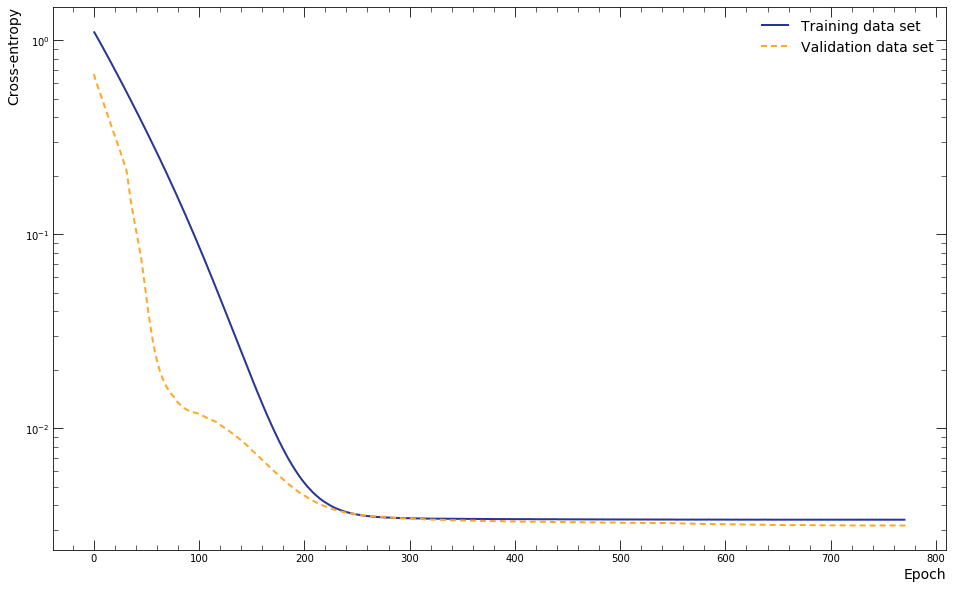

In [54]:
# Train neural networks
history = train_nn(model, x_train, pileup_train, 1024, "mse", model_name, x_val, pileup_val).history
plot_loss(history)

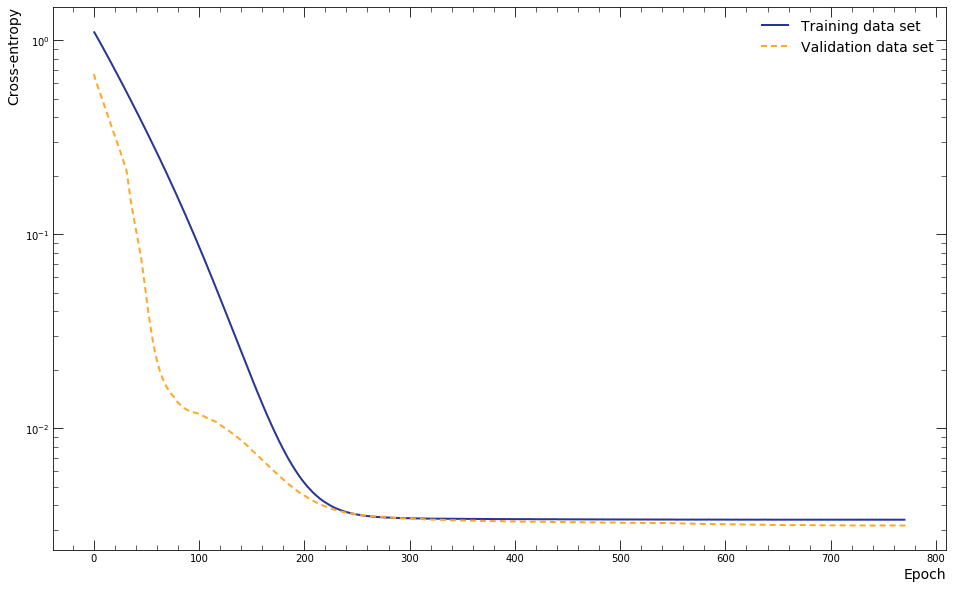

In [55]:
plot_loss(history)

In [56]:
for l in model.layers:
    print(l.name)
    print(l.get_weights())

input
[]
middle
[array([[0.48711002, 0.48711002, 0.48711002, ..., 0.48714975, 0.48714975,
        0.48716632],
       [0.47986263, 0.47986263, 0.47986263, ..., 0.47990534, 0.47990534,
        0.47992024],
       [0.4559388 , 0.4559388 , 0.4559388 , ..., 0.45598134, 0.45598134,
        0.45599595],
       ...,
       [1.6282556 , 1.6282556 , 1.6282556 , ..., 1.6282375 , 1.6282375 ,
        1.6282288 ],
       [1.6316357 , 1.6316357 , 1.6316357 , ..., 1.631618  , 1.631618  ,
        1.6316115 ],
       [1.6373738 , 1.6373738 , 1.6373738 , ..., 1.6373569 , 1.6373569 ,
        1.6373515 ]], dtype=float32), array([6.6212955e-08, 6.6212955e-08, 6.6212955e-08, 6.6212955e-08,
       6.6212955e-08, 6.6212955e-08, 6.6212955e-08, 6.6212955e-08,
       6.6212955e-08, 6.6212955e-08, 6.6212955e-08, 6.6212955e-08,
       6.6212955e-08, 6.6212955e-08, 6.6212955e-08, 6.6212955e-08,
       6.5280162e-08, 6.5280162e-08, 6.5280162e-08, 6.5280162e-08,
       1.0068929e-07, 1.0068929e-07, 6.5280162e-08, 6.5

# Training Set

<h1>304144</h1>

<h2>Displaying Inputs</h2>

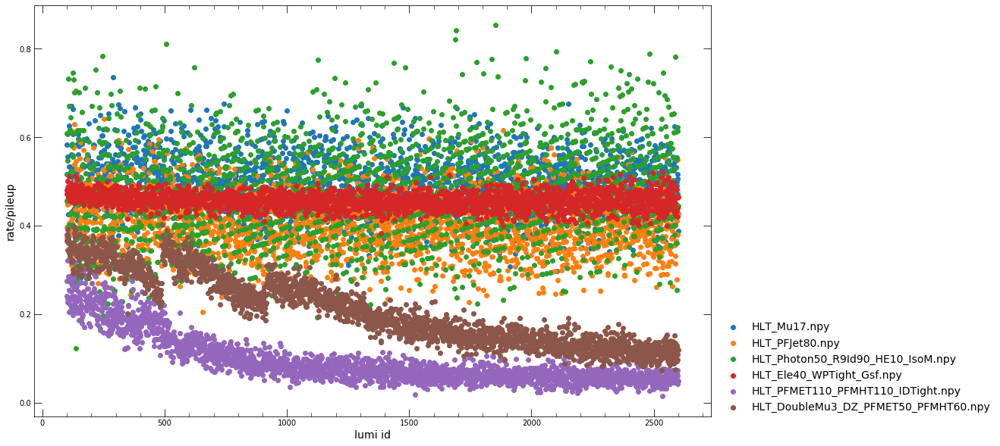

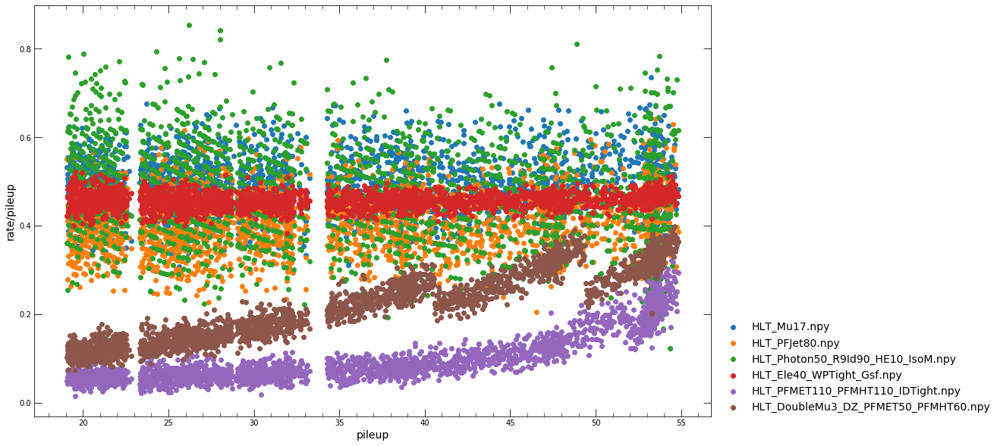

<h2>Plotting Errors</h2>

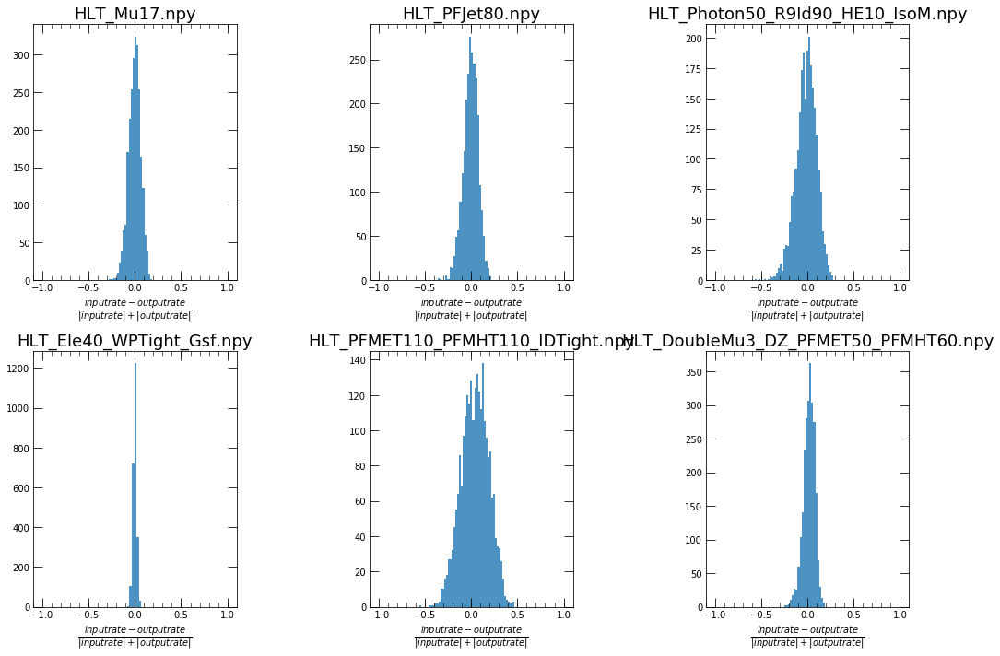

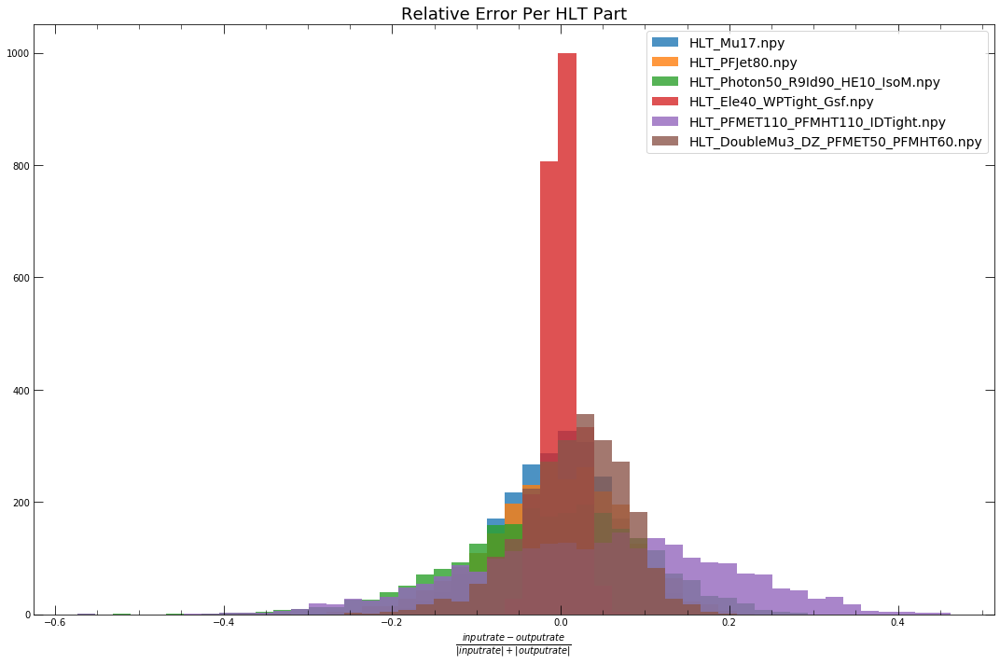

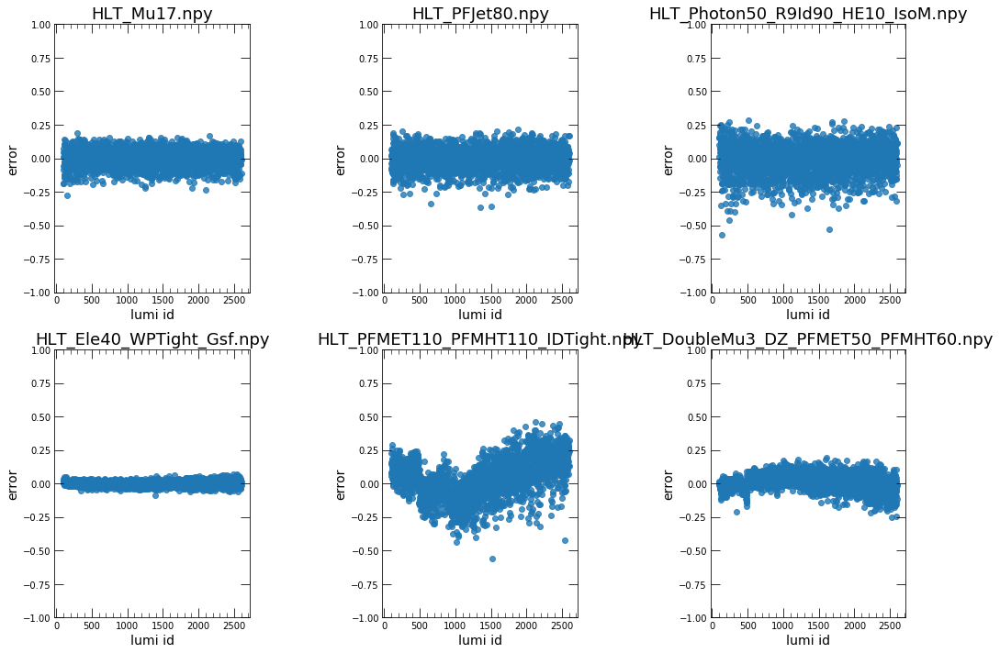

<h2>Plotting Inputs vs Outputs</h2>

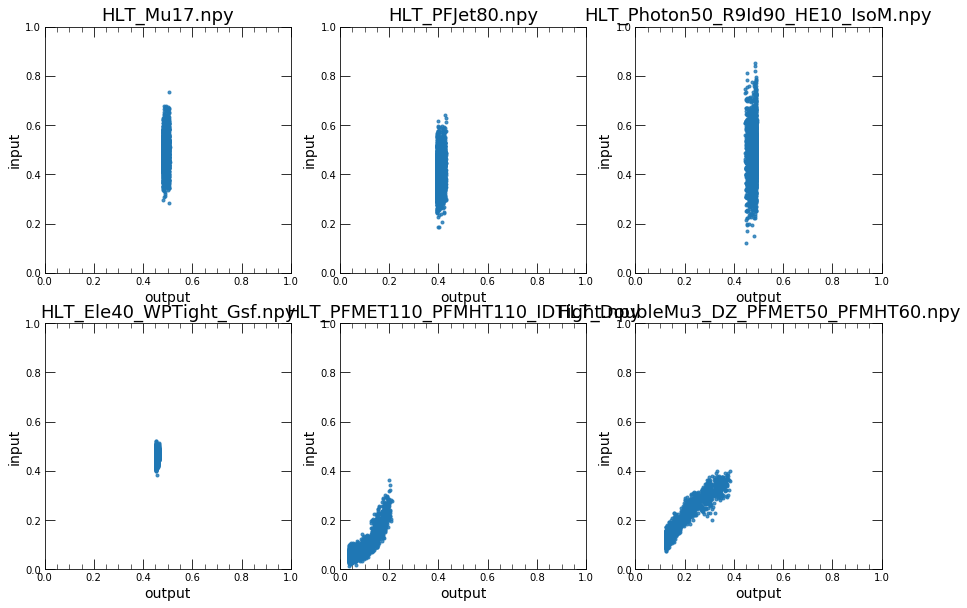

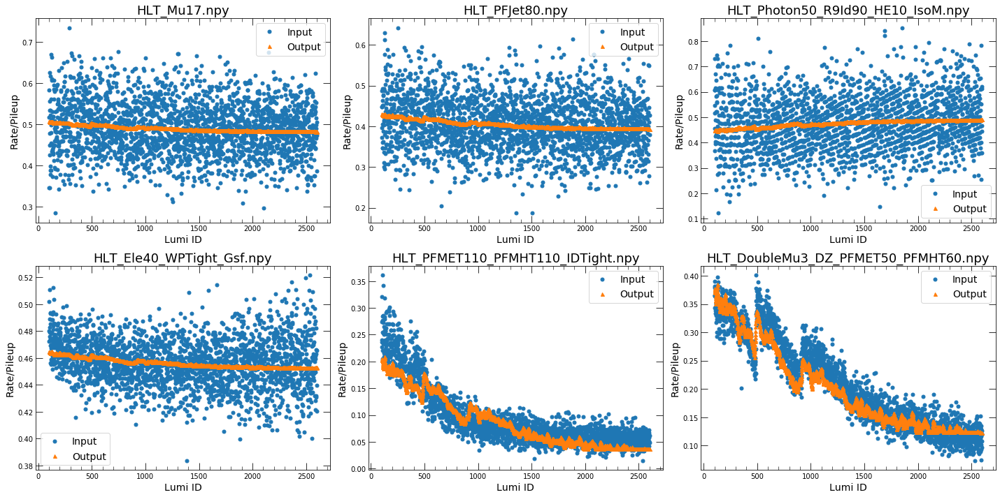

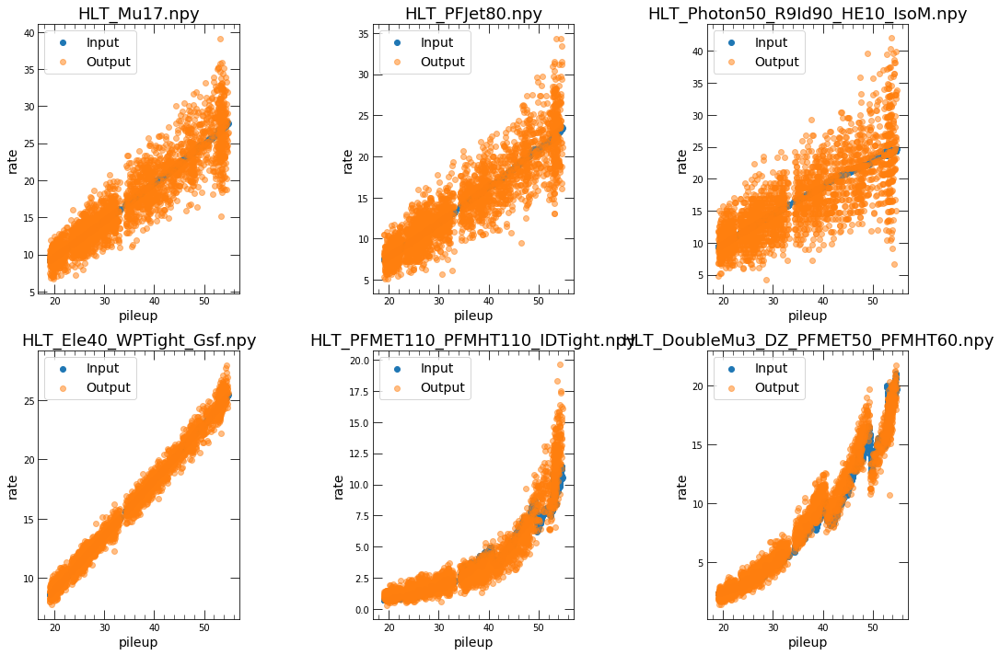

In [57]:
analyze_run(model_name,runs_by_era[m][n])

# Test Data

<h1>304125</h1>

<h2>Displaying Inputs</h2>

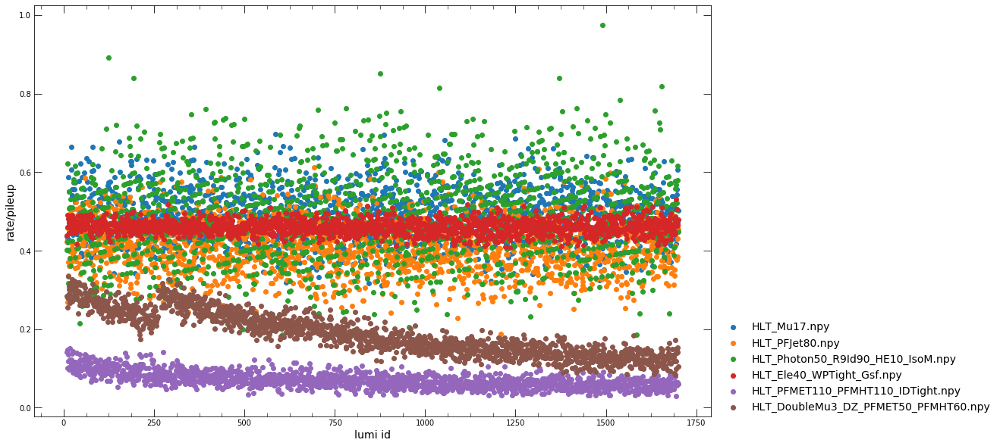

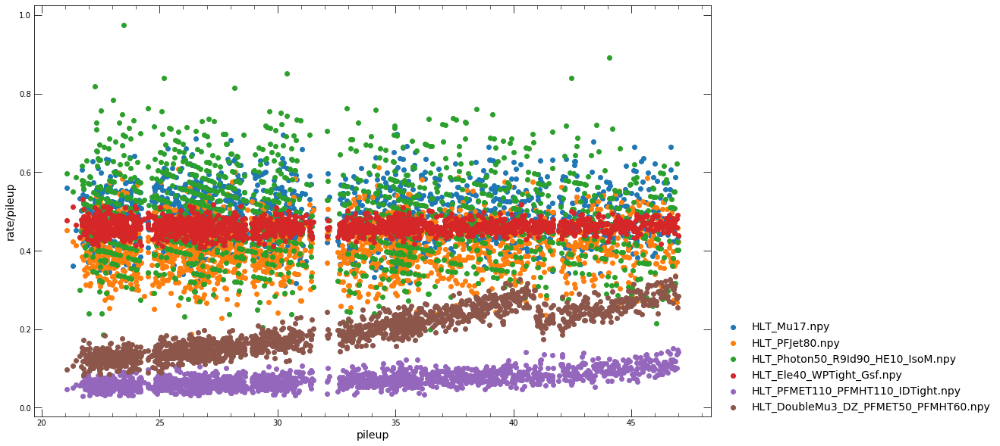

<h2>Plotting Errors</h2>

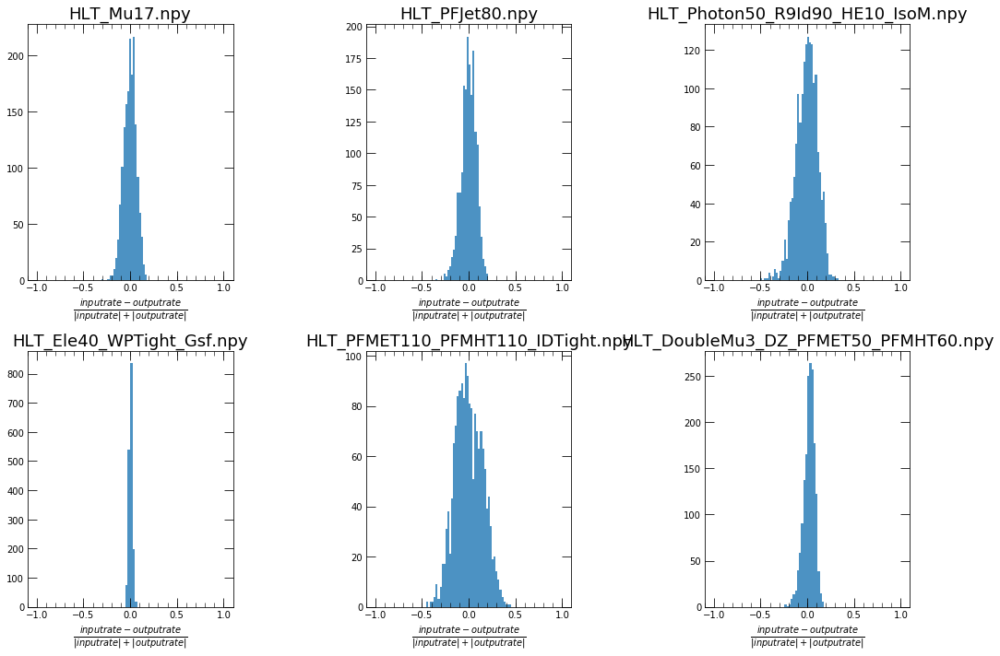

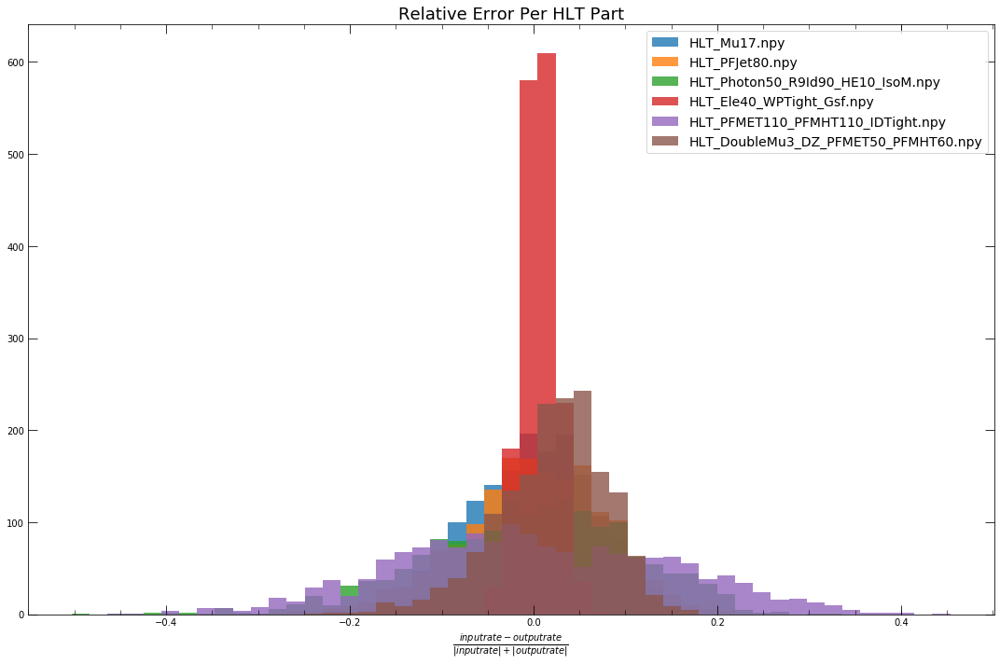

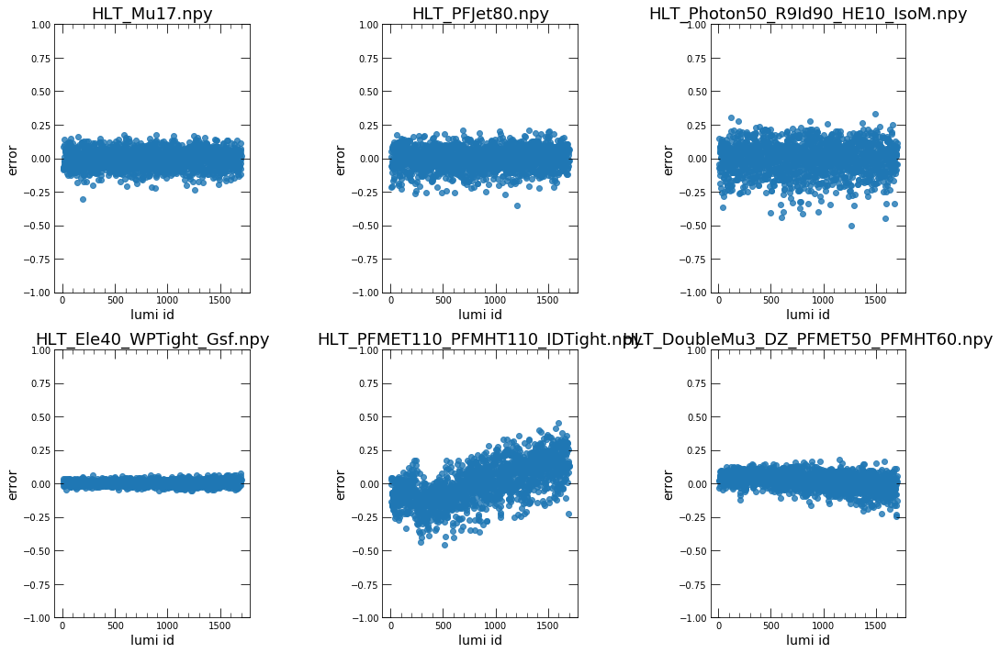

<h2>Plotting Inputs vs Outputs</h2>

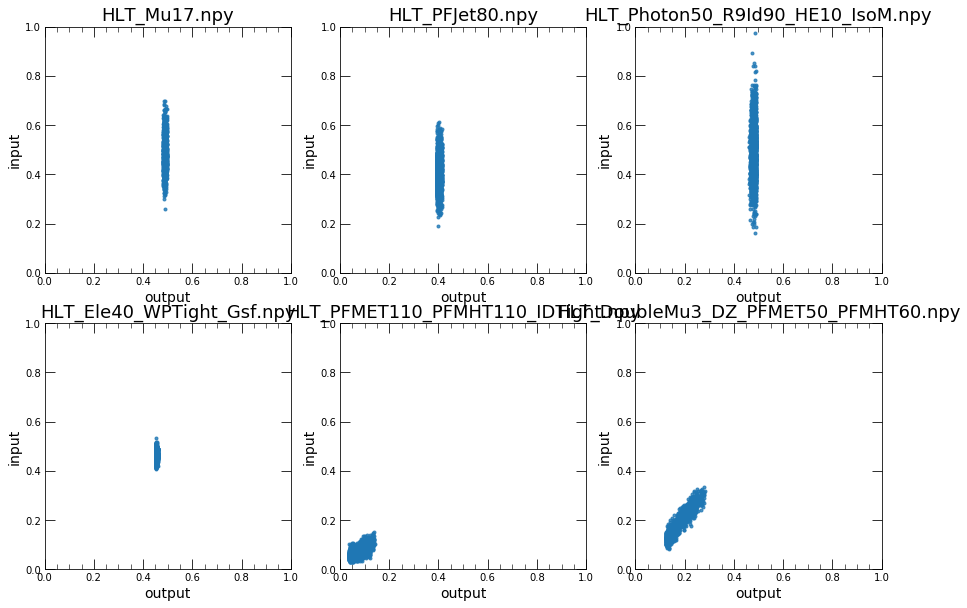

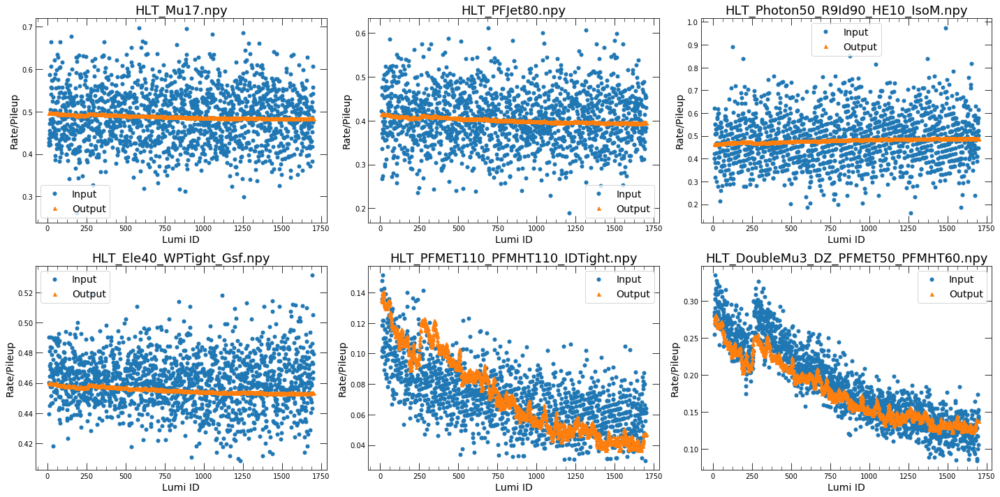

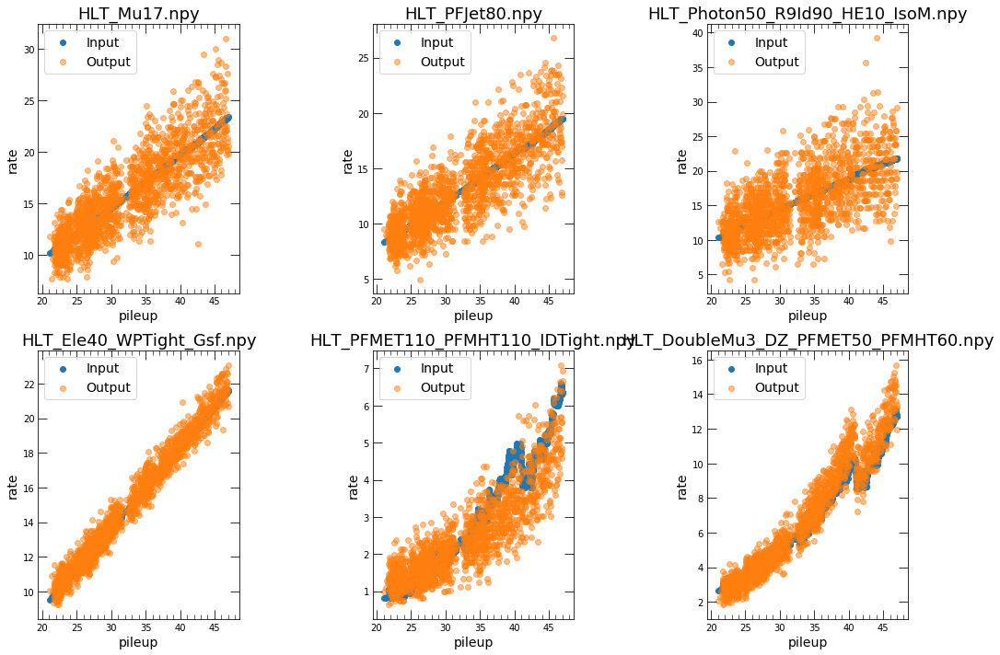

In [58]:
analyze_run(model_name,"304125")

# By Era

In [59]:
analyze_era('eraV210',good_data)

<h1>eraV210</h1>

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           (None, 90)                0         
_________________________________________________________________
middle (Dense)               (None, 45)                4095      
_________________________________________________________________
batch_normalization_29 (Batc (None, 45)                180       
_________________________________________________________________
encoded (Dense)              (None, 3)                 138       
_________________________________________________________________
batch_normalization_30 (Batc (None, 3)                 12        
_________________________________________________________________
middle2 (Dense)              (None, 45)                180       
_________________________________________________________________
batch_normalization_31 (Batc (None, 45)                180       
__________

OSError: Unable to create file (unable to lock file, errno = 35, error message = 'Resource temporarily unavailable')

In [ ]:
compare_good_bad('eraV210',good_data,bad_data)

<h1>eraV211</h1>

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           (None, 90)                0         
_________________________________________________________________
middle (Dense)               (None, 45)                4095      
_________________________________________________________________
batch_normalization_9 (Batch (None, 45)                180       
_________________________________________________________________
encoded (Dense)              (None, 3)                 138       
_________________________________________________________________
batch_normalization_10 (Batc (None, 3)                 12        
_________________________________________________________________
middle2 (Dense)              (None, 45)                180       
_________________________________________________________________
batch_normalization_11 (Batc (None, 45)                180       
__________

Epoch 117/1000
 - 0s - loss: 0.4687 - val_loss: 1.0095
Epoch 118/1000
 - 0s - loss: 0.4649 - val_loss: 0.9744
Epoch 119/1000
 - 0s - loss: 0.4612 - val_loss: 0.9425
Epoch 120/1000
 - 0s - loss: 0.4575 - val_loss: 0.9135
Epoch 121/1000
 - 0s - loss: 0.4538 - val_loss: 0.8869
Epoch 122/1000
 - 0s - loss: 0.4501 - val_loss: 0.8626
Epoch 123/1000
 - 0s - loss: 0.4464 - val_loss: 0.8400
Epoch 124/1000
 - 0s - loss: 0.4428 - val_loss: 0.8192
Epoch 125/1000
 - 0s - loss: 0.4392 - val_loss: 0.8000
Epoch 126/1000
 - 0s - loss: 0.4357 - val_loss: 0.7819
Epoch 127/1000
 - 0s - loss: 0.4321 - val_loss: 0.7651
Epoch 128/1000
 - 0s - loss: 0.4286 - val_loss: 0.7492
Epoch 129/1000
 - 0s - loss: 0.4251 - val_loss: 0.7342
Epoch 130/1000
 - 0s - loss: 0.4216 - val_loss: 0.7199
Epoch 131/1000
 - 0s - loss: 0.4182 - val_loss: 0.7064
Epoch 132/1000
 - 0s - loss: 0.4148 - val_loss: 0.6934
Epoch 133/1000
 - 0s - loss: 0.4114 - val_loss: 0.6809
Epoch 134/1000
 - 0s - loss: 0.4080 - val_loss: 0.6689
Epoch 135/

Epoch 266/1000
 - 0s - loss: 0.1292 - val_loss: 0.0912
Epoch 267/1000
 - 0s - loss: 0.1280 - val_loss: 0.0905
Epoch 268/1000
 - 0s - loss: 0.1268 - val_loss: 0.0898
Epoch 269/1000
 - 0s - loss: 0.1256 - val_loss: 0.0891
Epoch 270/1000
 - 0s - loss: 0.1244 - val_loss: 0.0884
Epoch 271/1000
 - 0s - loss: 0.1232 - val_loss: 0.0878
Epoch 272/1000
 - 0s - loss: 0.1221 - val_loss: 0.0871
Epoch 273/1000
 - 0s - loss: 0.1209 - val_loss: 0.0865
Epoch 274/1000
 - 0s - loss: 0.1198 - val_loss: 0.0858
Epoch 275/1000
 - 0s - loss: 0.1187 - val_loss: 0.0852
Epoch 276/1000
 - 0s - loss: 0.1176 - val_loss: 0.0846
Epoch 277/1000
 - 0s - loss: 0.1164 - val_loss: 0.0840
Epoch 278/1000
 - 0s - loss: 0.1153 - val_loss: 0.0834
Epoch 279/1000
 - 0s - loss: 0.1142 - val_loss: 0.0829
Epoch 280/1000
 - 0s - loss: 0.1132 - val_loss: 0.0823
Epoch 281/1000
 - 0s - loss: 0.1121 - val_loss: 0.0818
Epoch 282/1000
 - 0s - loss: 0.1110 - val_loss: 0.0812
Epoch 283/1000
 - 0s - loss: 0.1100 - val_loss: 0.0807
Epoch 284/

Epoch 415/1000
 - 0s - loss: 0.0286 - val_loss: 0.0498
Epoch 416/1000
 - 0s - loss: 0.0283 - val_loss: 0.0497
Epoch 417/1000
 - 0s - loss: 0.0280 - val_loss: 0.0495
Epoch 418/1000
 - 0s - loss: 0.0277 - val_loss: 0.0493
Epoch 419/1000
 - 0s - loss: 0.0275 - val_loss: 0.0491
Epoch 420/1000
 - 0s - loss: 0.0272 - val_loss: 0.0490
Epoch 421/1000
 - 0s - loss: 0.0269 - val_loss: 0.0488
Epoch 422/1000
 - 0s - loss: 0.0266 - val_loss: 0.0486
Epoch 423/1000
 - 0s - loss: 0.0263 - val_loss: 0.0484
Epoch 424/1000
 - 0s - loss: 0.0260 - val_loss: 0.0483
Epoch 425/1000
 - 0s - loss: 0.0258 - val_loss: 0.0481
Epoch 426/1000
 - 0s - loss: 0.0255 - val_loss: 0.0479
Epoch 427/1000
 - 0s - loss: 0.0252 - val_loss: 0.0477
Epoch 428/1000
 - 0s - loss: 0.0250 - val_loss: 0.0476
Epoch 429/1000
 - 0s - loss: 0.0247 - val_loss: 0.0474
Epoch 430/1000
 - 0s - loss: 0.0244 - val_loss: 0.0472
Epoch 431/1000
 - 0s - loss: 0.0242 - val_loss: 0.0470
Epoch 432/1000
 - 0s - loss: 0.0239 - val_loss: 0.0468
Epoch 433/

Epoch 564/1000
 - 0s - loss: 0.0069 - val_loss: 0.0201
Epoch 565/1000
 - 0s - loss: 0.0068 - val_loss: 0.0199
Epoch 566/1000
 - 0s - loss: 0.0068 - val_loss: 0.0197
Epoch 567/1000
 - 0s - loss: 0.0067 - val_loss: 0.0196
Epoch 568/1000
 - 0s - loss: 0.0067 - val_loss: 0.0194
Epoch 569/1000
 - 0s - loss: 0.0066 - val_loss: 0.0192
Epoch 570/1000
 - 0s - loss: 0.0066 - val_loss: 0.0191
Epoch 571/1000
 - 0s - loss: 0.0065 - val_loss: 0.0189
Epoch 572/1000
 - 0s - loss: 0.0065 - val_loss: 0.0187
Epoch 573/1000
 - 0s - loss: 0.0064 - val_loss: 0.0186
Epoch 574/1000
 - 0s - loss: 0.0064 - val_loss: 0.0184
Epoch 575/1000
 - 0s - loss: 0.0063 - val_loss: 0.0183
Epoch 576/1000
 - 0s - loss: 0.0063 - val_loss: 0.0181
Epoch 577/1000
 - 0s - loss: 0.0063 - val_loss: 0.0180
Epoch 578/1000
 - 0s - loss: 0.0062 - val_loss: 0.0179
Epoch 579/1000
 - 0s - loss: 0.0062 - val_loss: 0.0177
Epoch 580/1000
 - 0s - loss: 0.0061 - val_loss: 0.0176
Epoch 581/1000
 - 0s - loss: 0.0061 - val_loss: 0.0174
Epoch 582/

Epoch 713/1000
 - 0s - loss: 0.0037 - val_loss: 0.0081
Epoch 714/1000
 - 0s - loss: 0.0037 - val_loss: 0.0080
Epoch 715/1000
 - 0s - loss: 0.0037 - val_loss: 0.0080
Epoch 716/1000
 - 0s - loss: 0.0037 - val_loss: 0.0080
Epoch 717/1000
 - 0s - loss: 0.0037 - val_loss: 0.0080
Epoch 718/1000
 - 0s - loss: 0.0037 - val_loss: 0.0079
Epoch 719/1000
 - 0s - loss: 0.0037 - val_loss: 0.0079
Epoch 720/1000
 - 0s - loss: 0.0037 - val_loss: 0.0079
Epoch 721/1000
 - 0s - loss: 0.0037 - val_loss: 0.0079
Epoch 722/1000
 - 0s - loss: 0.0037 - val_loss: 0.0078
Epoch 723/1000
 - 0s - loss: 0.0036 - val_loss: 0.0078
Epoch 724/1000
 - 0s - loss: 0.0036 - val_loss: 0.0078
Epoch 725/1000
 - 0s - loss: 0.0036 - val_loss: 0.0078
Epoch 726/1000
 - 0s - loss: 0.0036 - val_loss: 0.0078
Epoch 727/1000
 - 0s - loss: 0.0036 - val_loss: 0.0077
Epoch 728/1000
 - 0s - loss: 0.0036 - val_loss: 0.0077
Epoch 729/1000
 - 0s - loss: 0.0036 - val_loss: 0.0077
Epoch 730/1000
 - 0s - loss: 0.0036 - val_loss: 0.0077
Epoch 731/

Epoch 862/1000
 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 863/1000
 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 864/1000
 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 865/1000
 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 866/1000
 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 867/1000
 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 868/1000
 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 869/1000
 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 870/1000
 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 871/1000
 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 872/1000
 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 873/1000
 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 874/1000
 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 875/1000
 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 876/1000
 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 877/1000
 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 878/1000
 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 879/1000
 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 880/

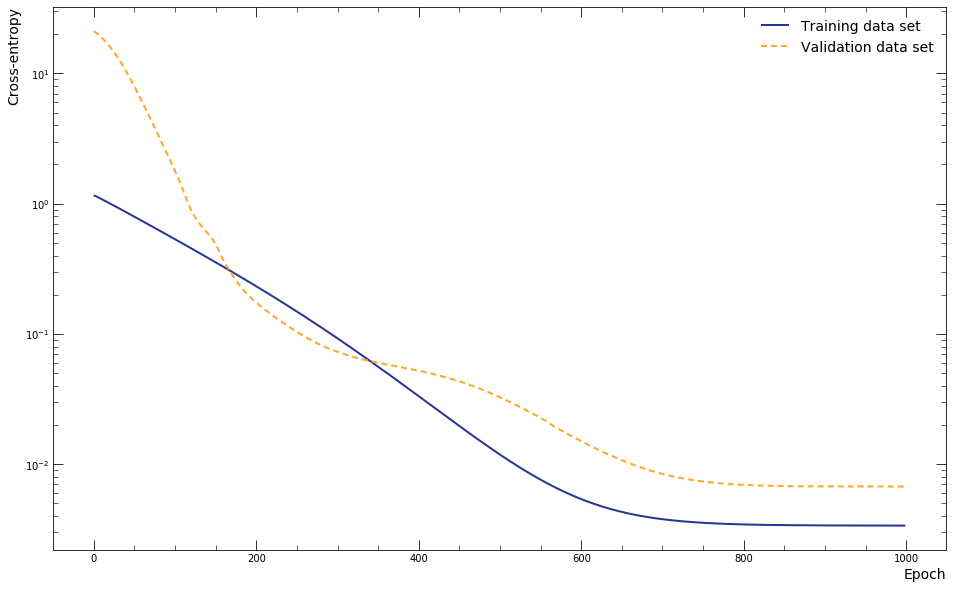

<h1>300283</h1>

<h1>300234</h1>

<h1>300233</h1>

<h1>300282</h1>

<h1>300235</h1>

<h2>Displaying Inputs</h2>

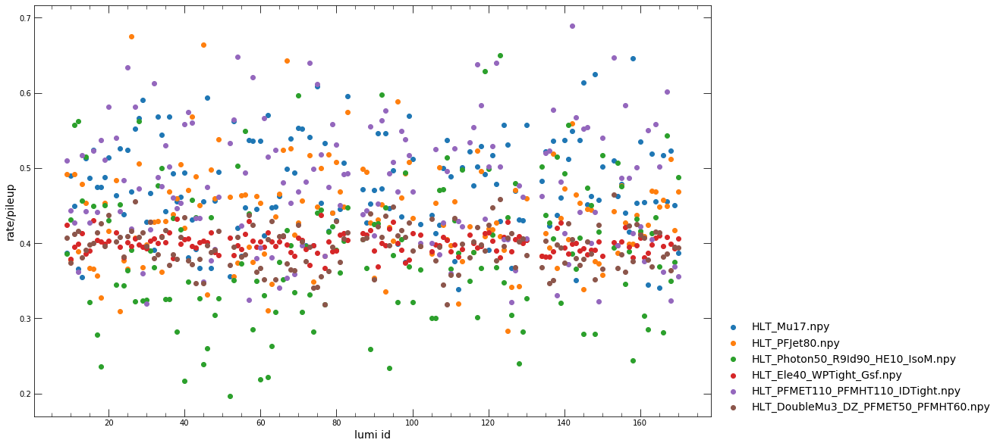

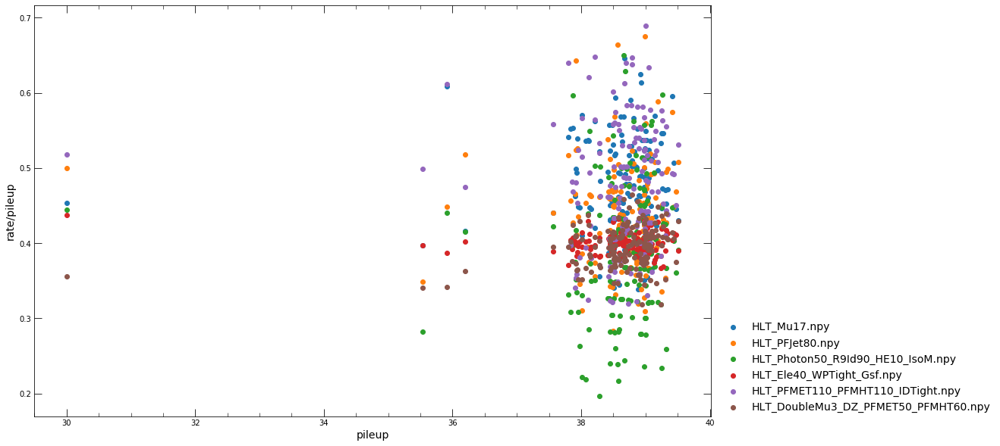

<h2>Plotting Errors</h2>

AUTO BINNING


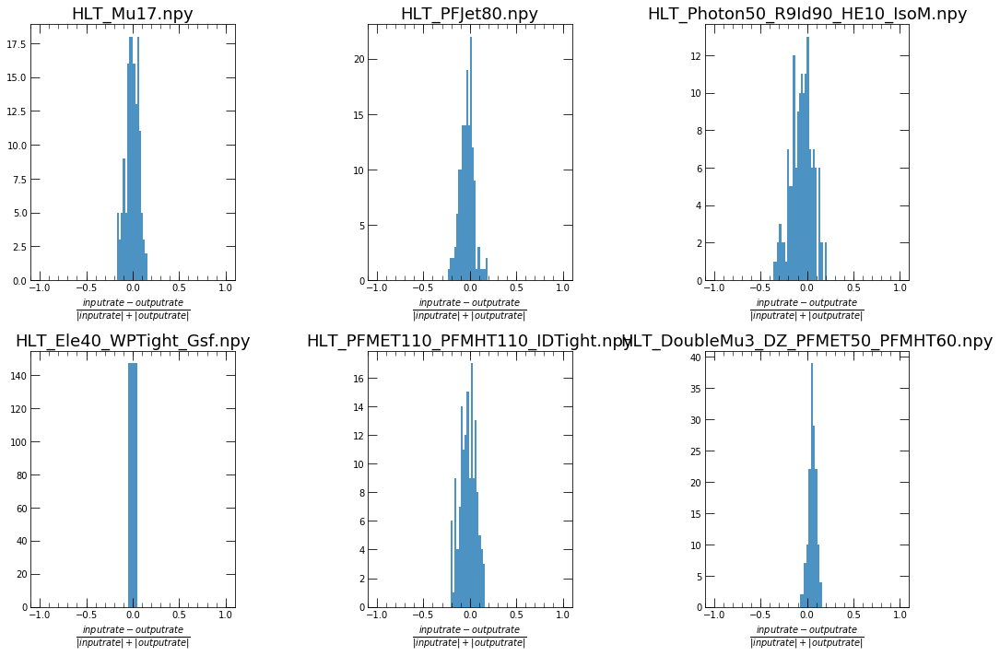

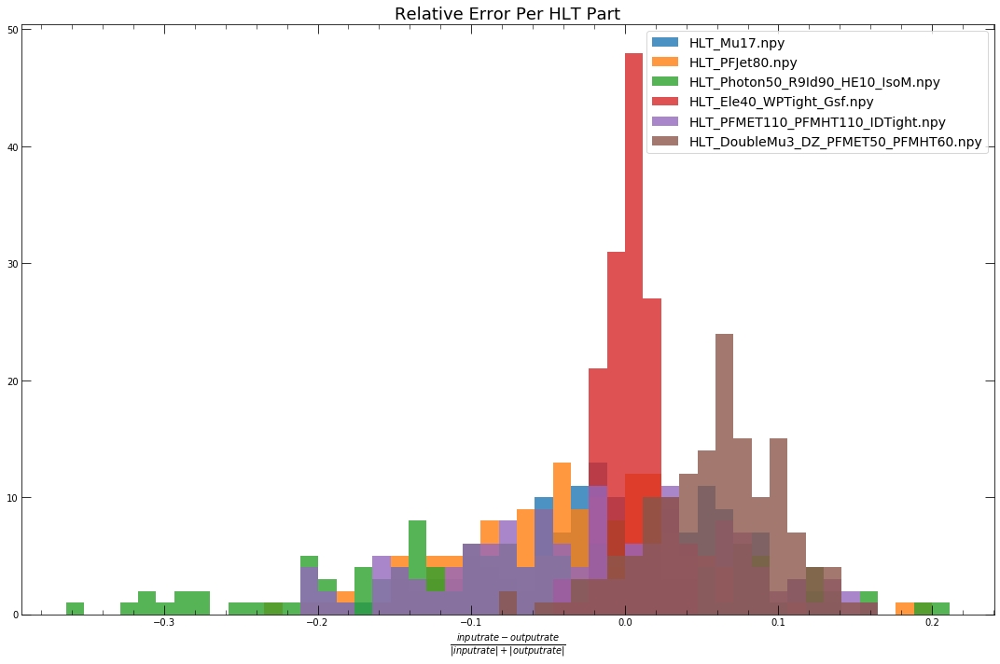

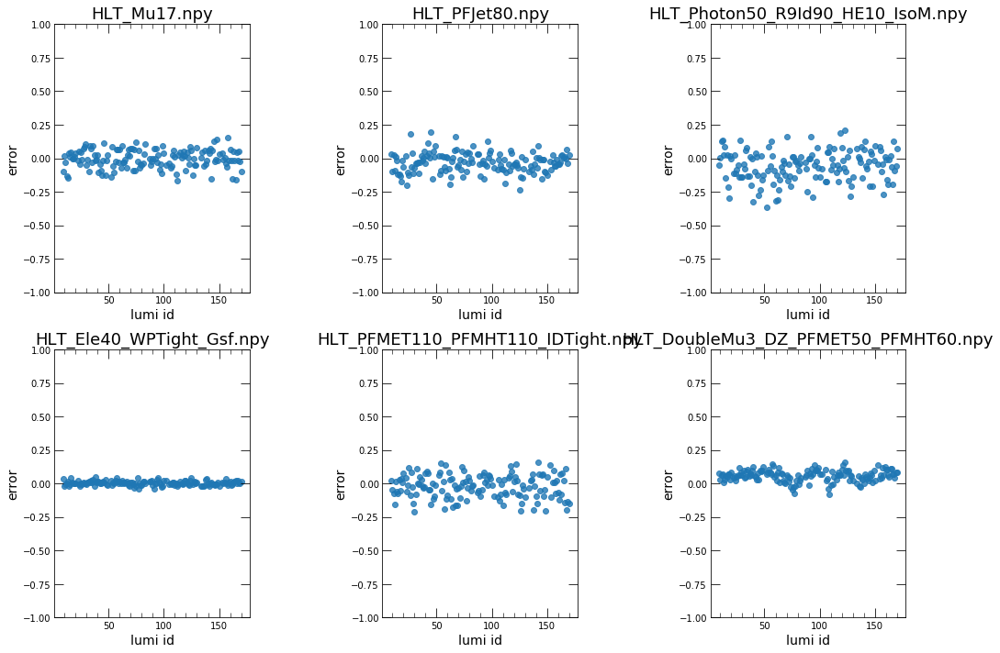

<h2>Plotting Inputs vs Outputs</h2>

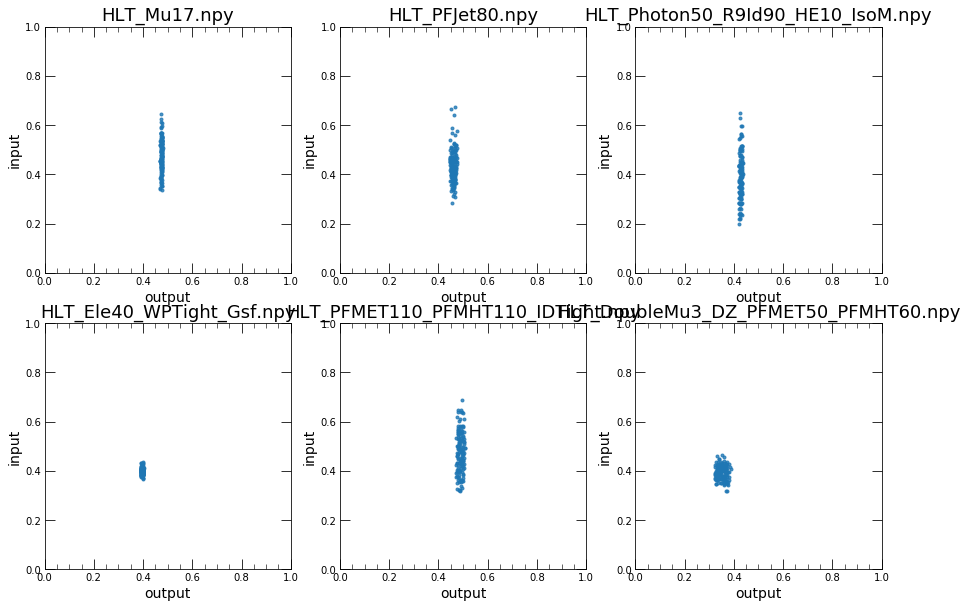

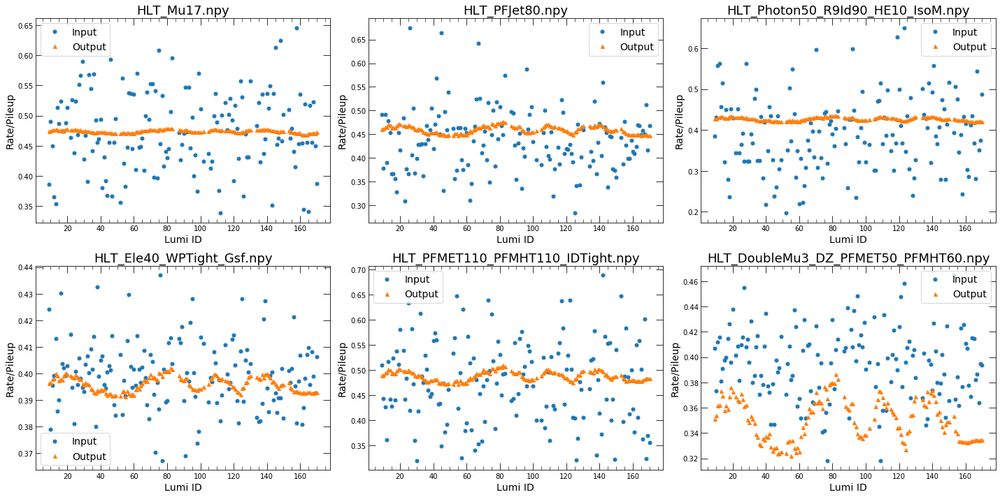

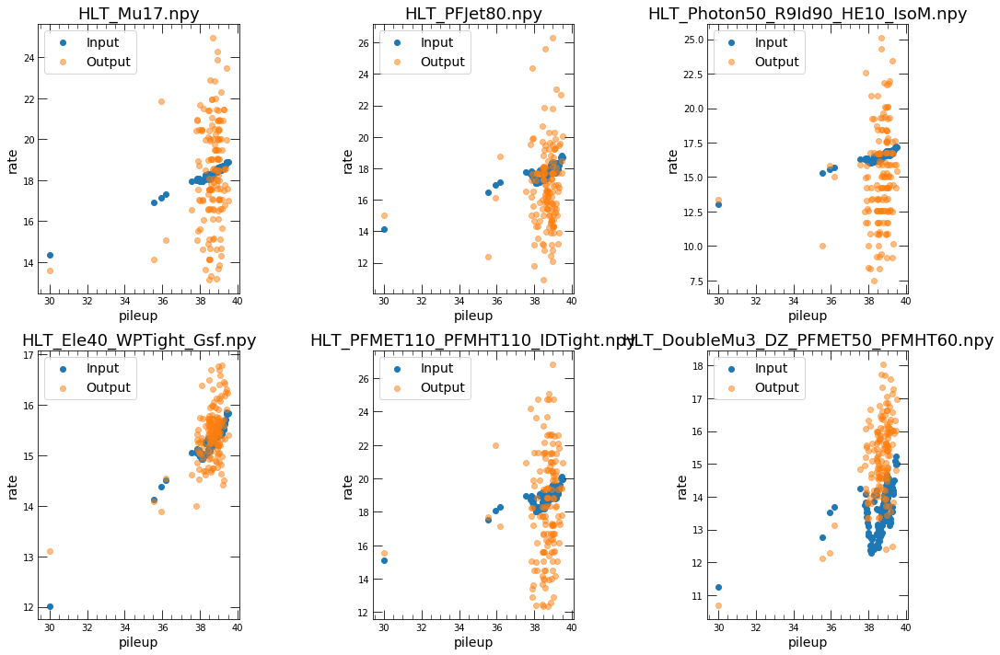

<h1>300236</h1>

<h2>Displaying Inputs</h2>

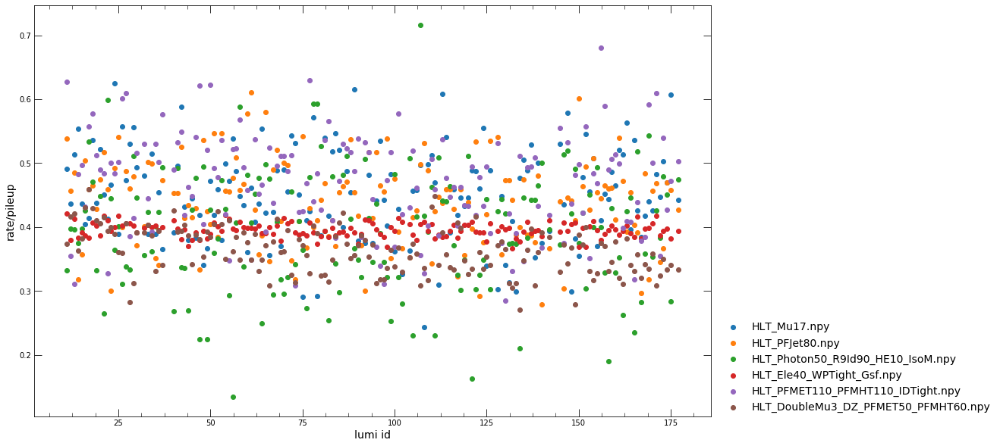

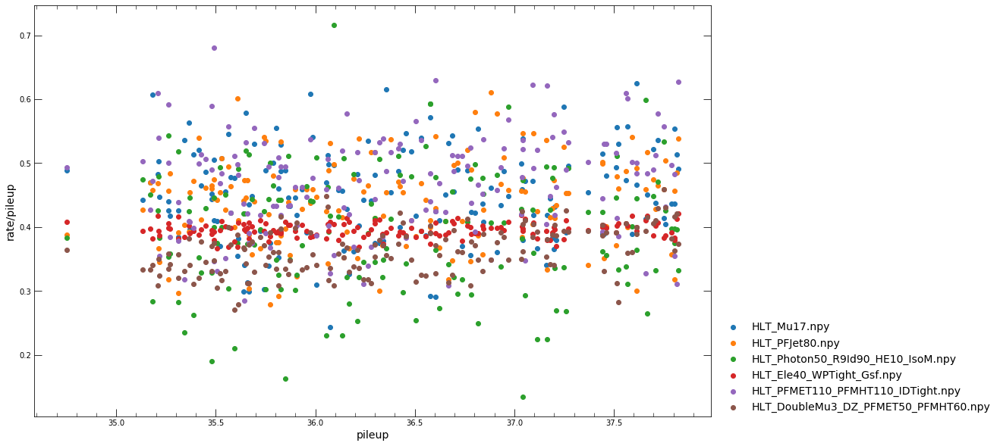

<h2>Plotting Errors</h2>

AUTO BINNING


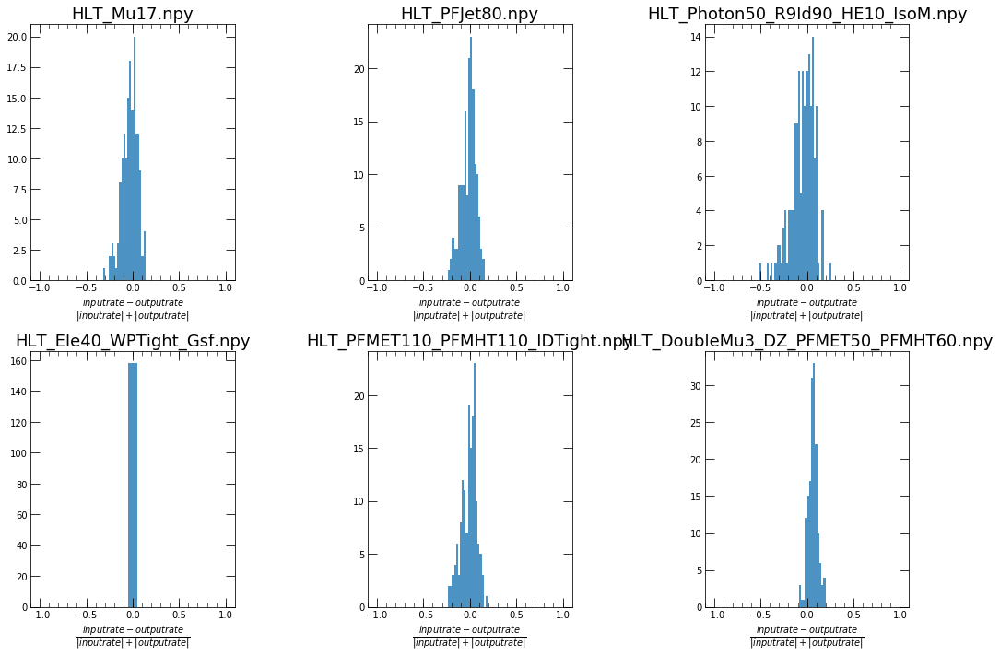

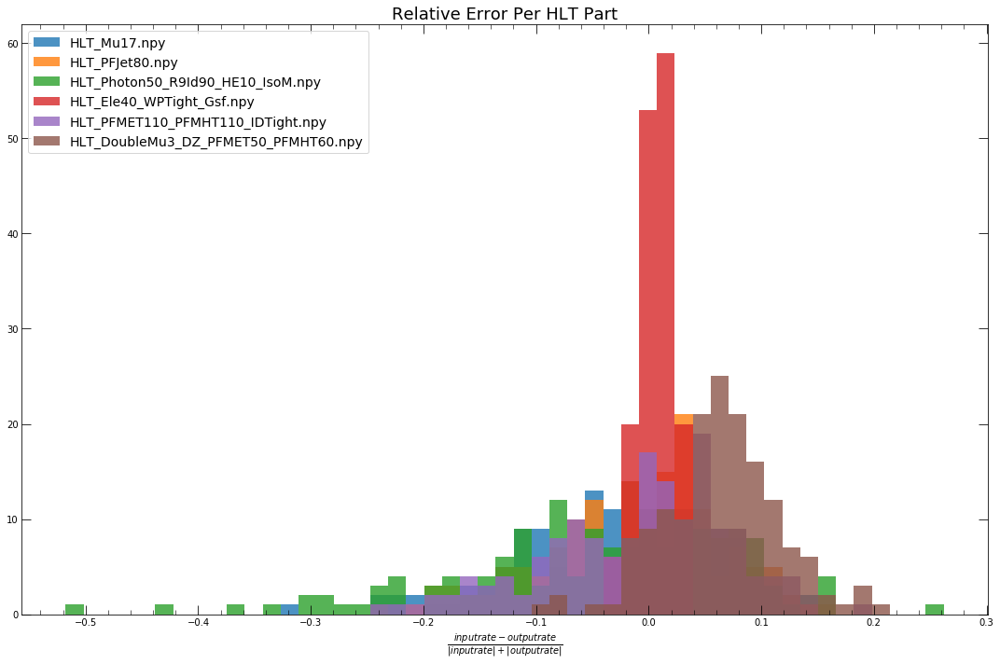

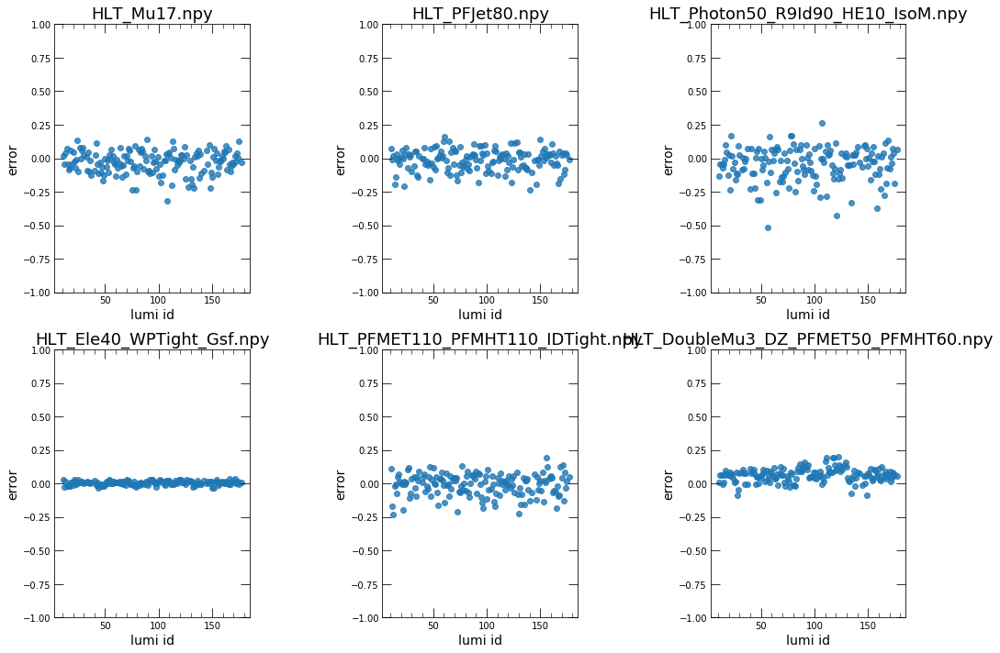

<h2>Plotting Inputs vs Outputs</h2>

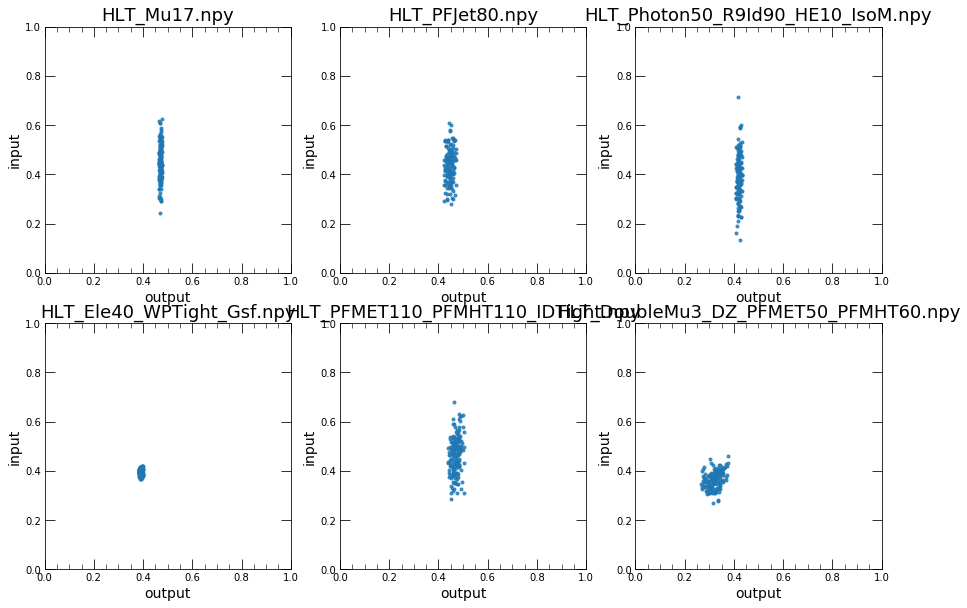

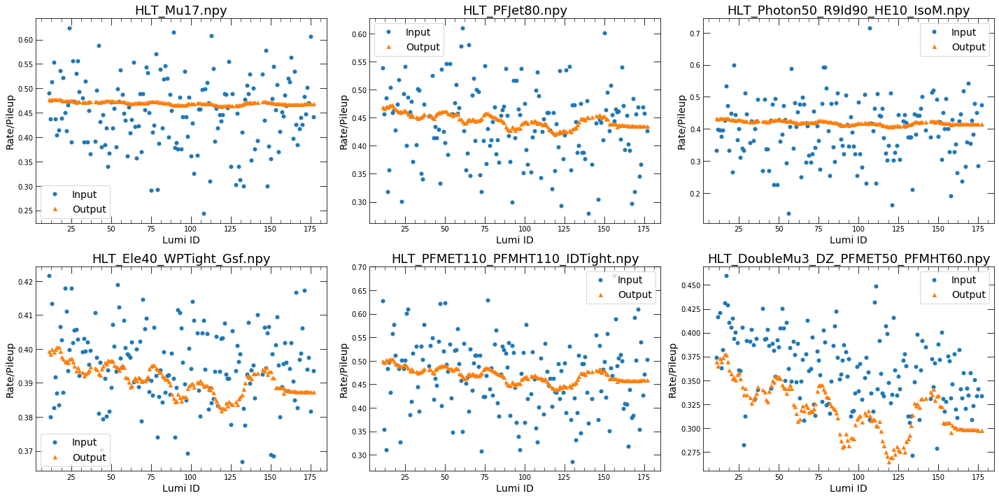

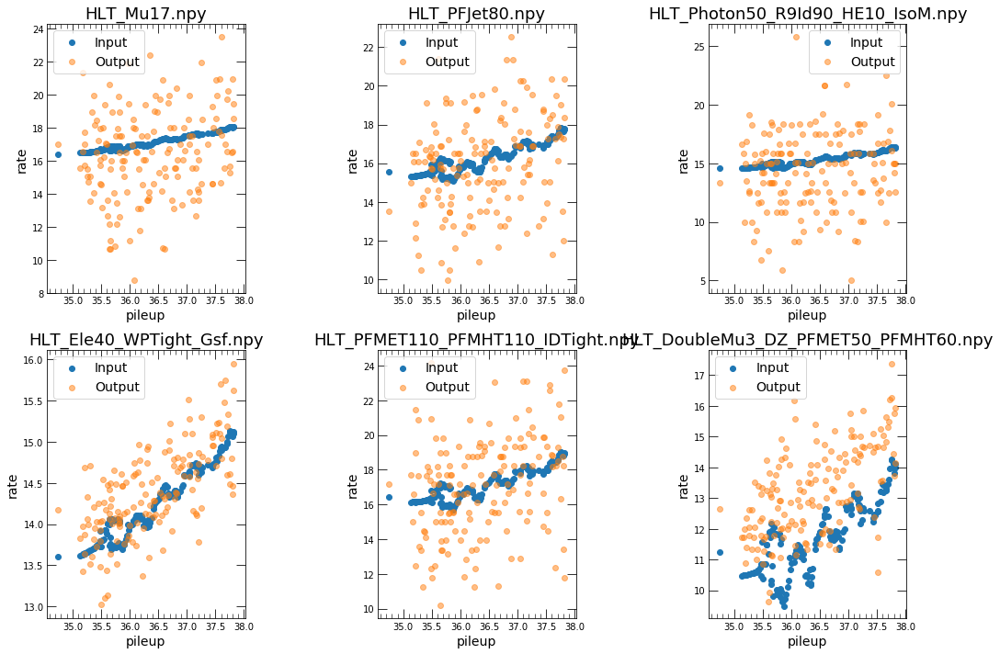

<h1>300239</h1>

<h2>Displaying Inputs</h2>

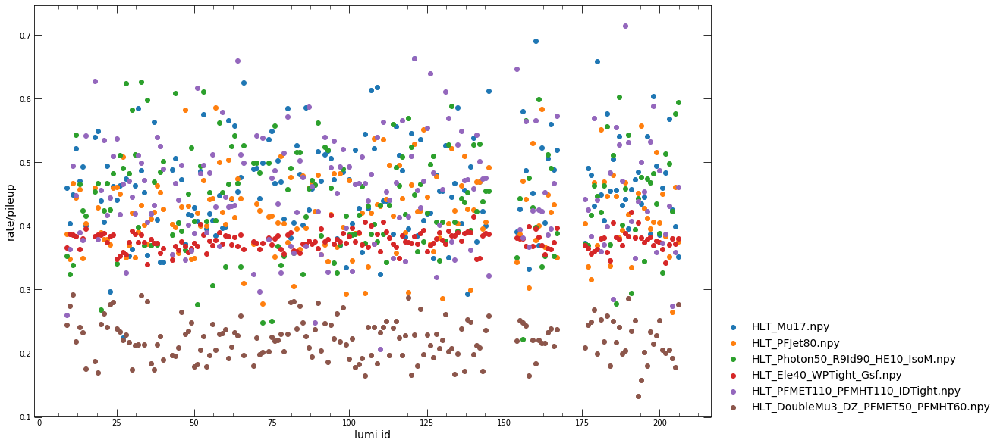

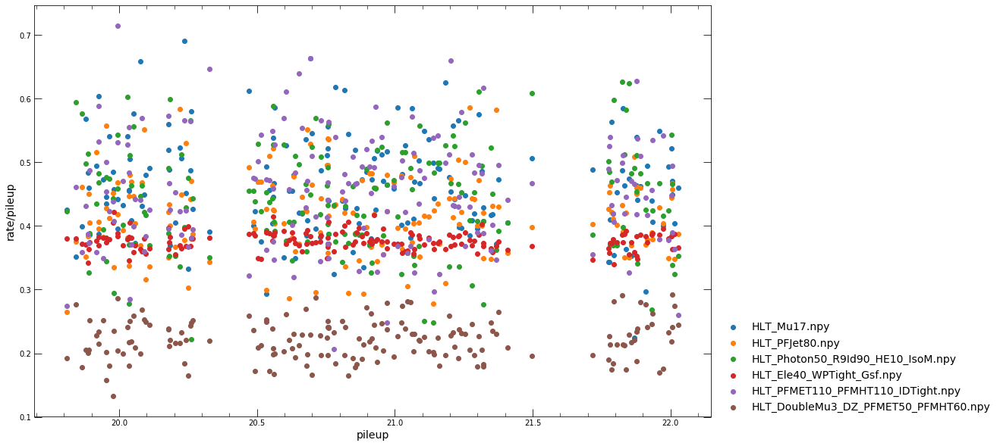

<h2>Plotting Errors</h2>

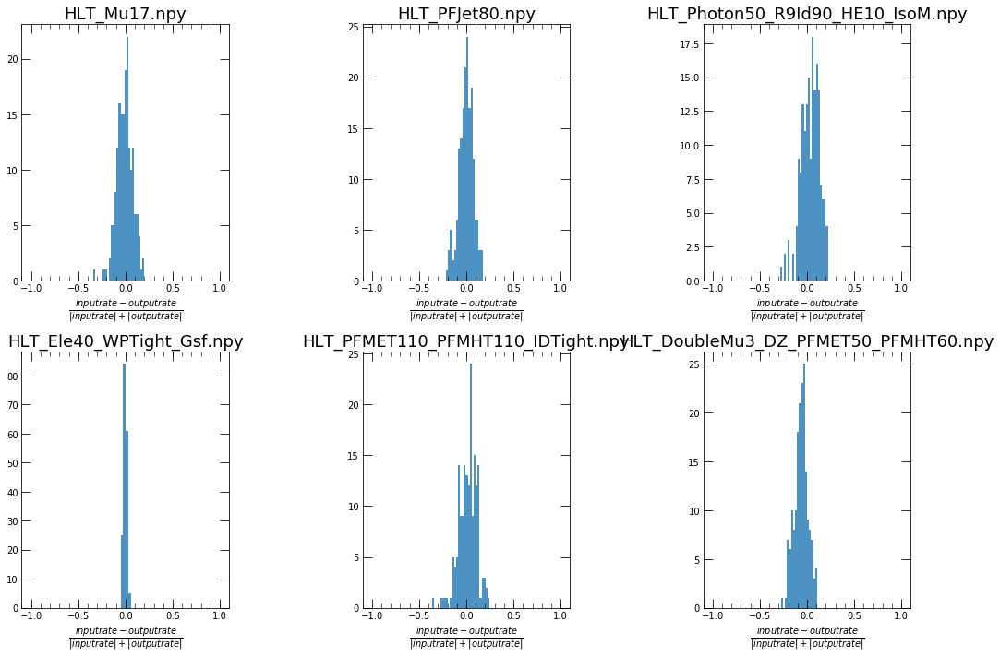

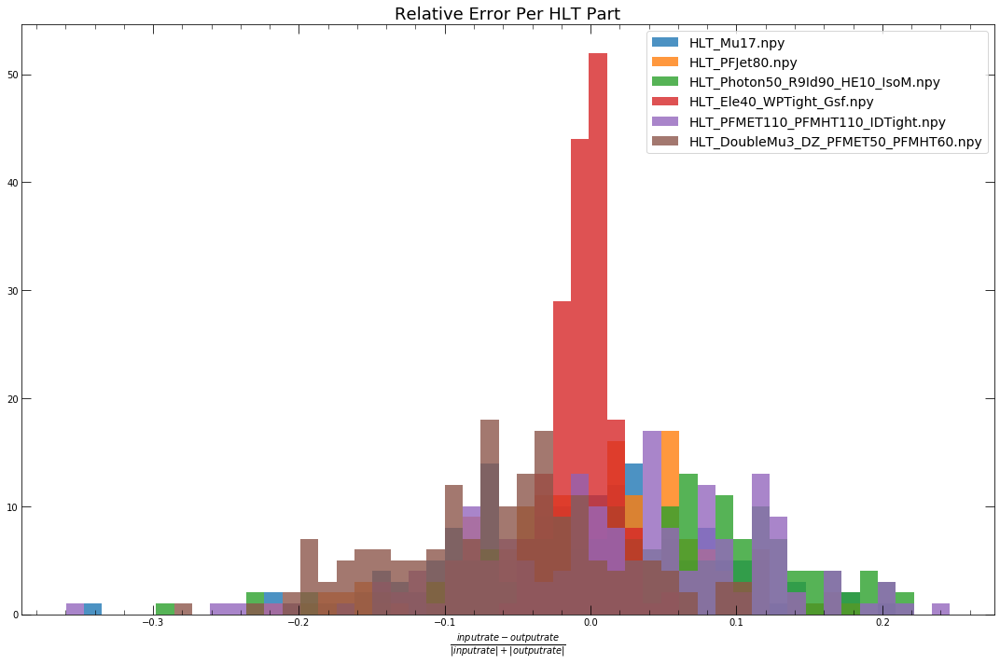

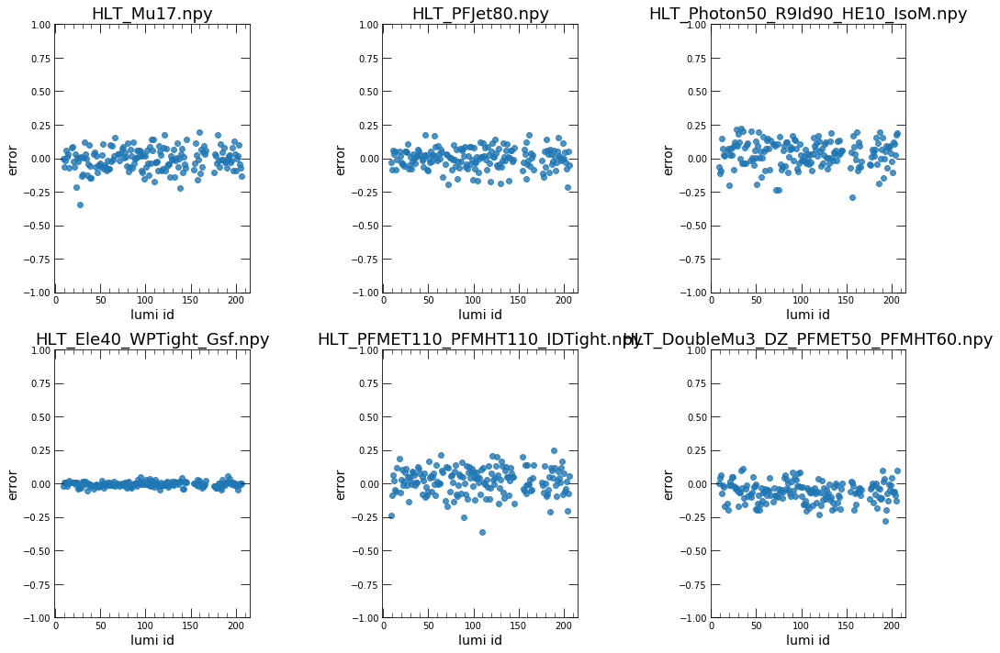

<h2>Plotting Inputs vs Outputs</h2>

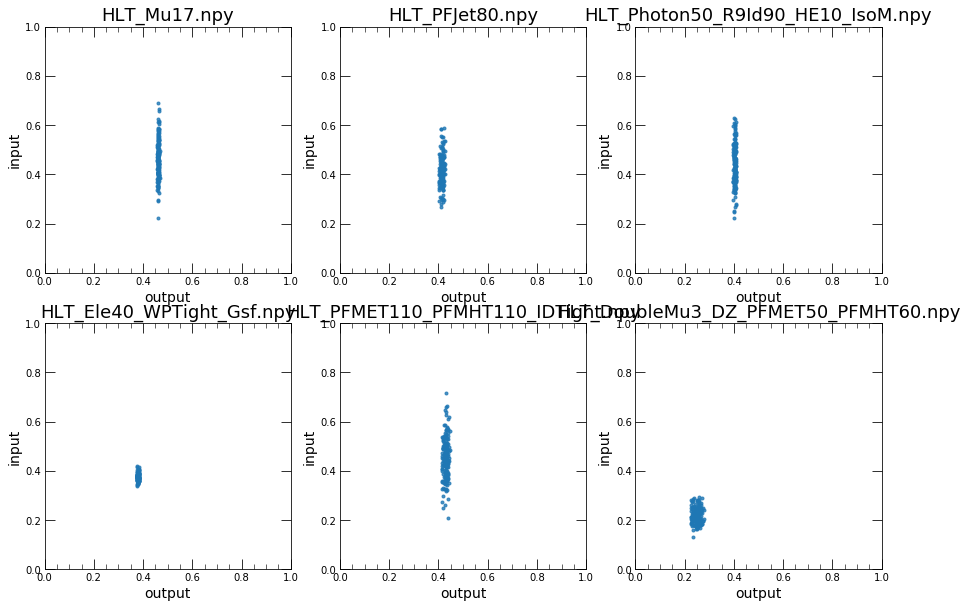

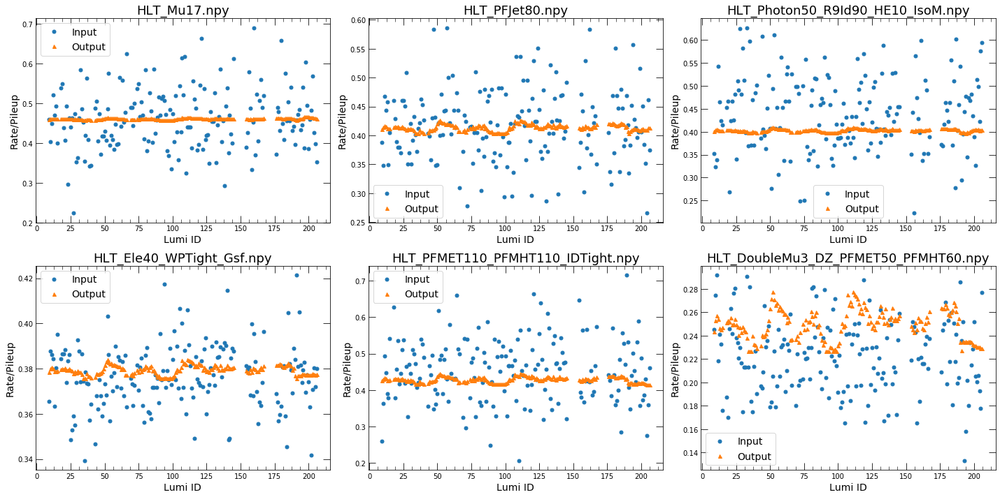

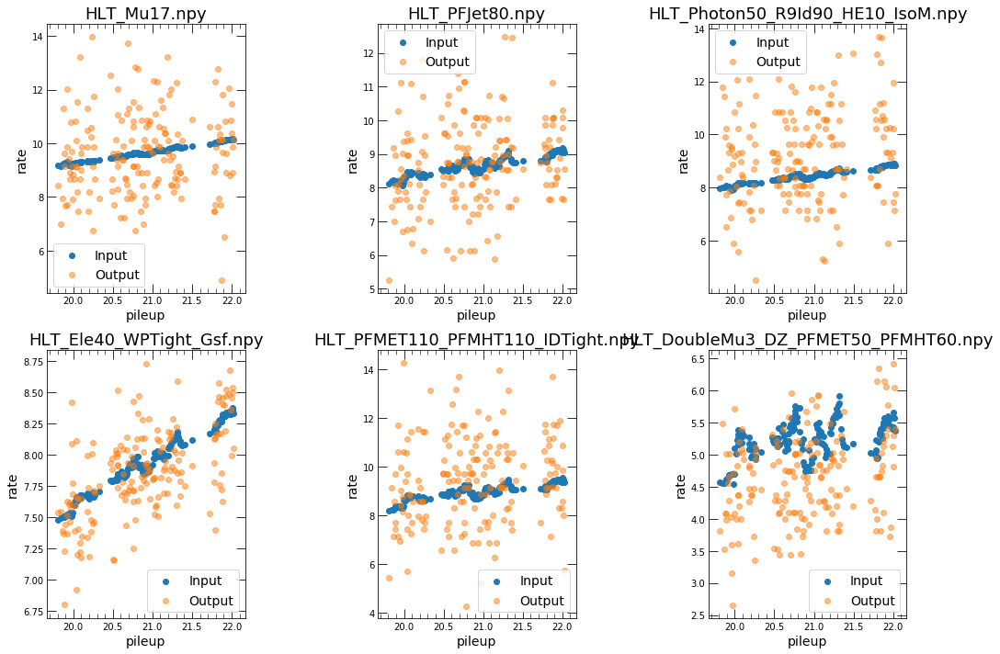

<h1>300238</h1>

<h2>Displaying Inputs</h2>

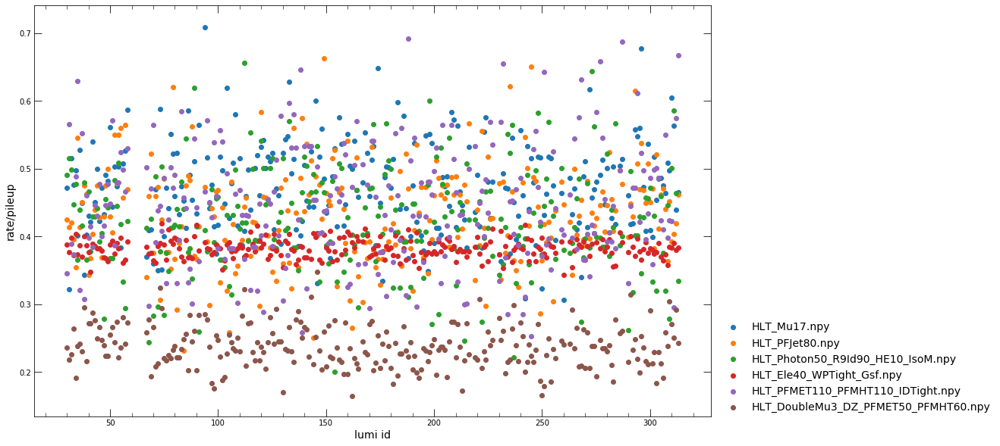

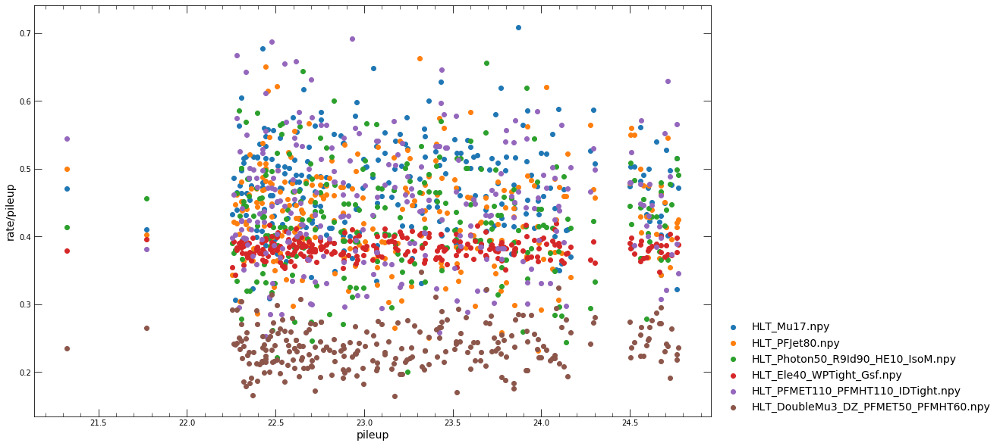

<h2>Plotting Errors</h2>

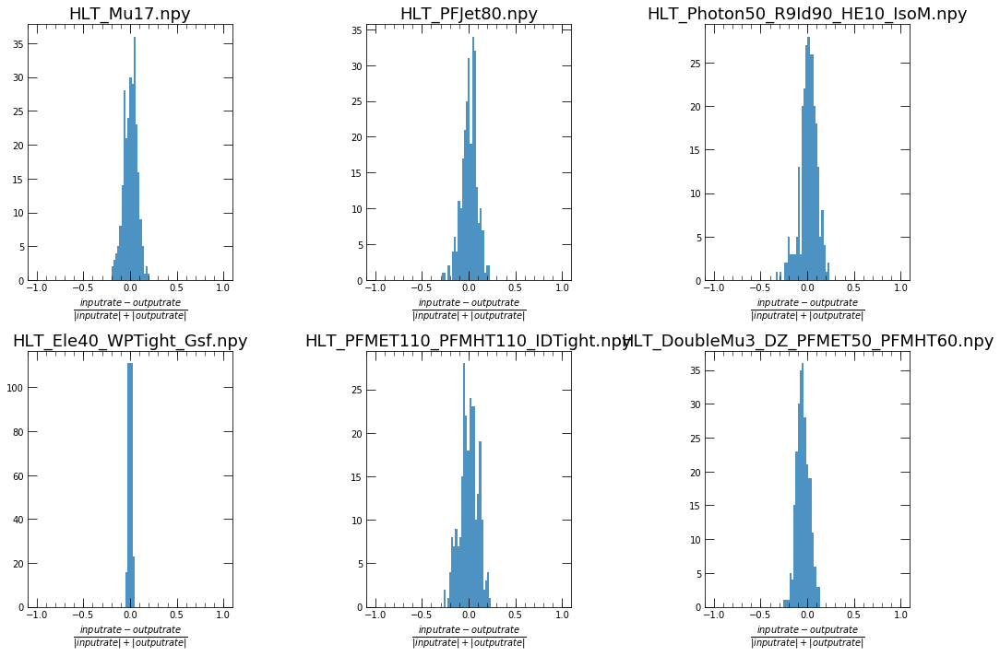

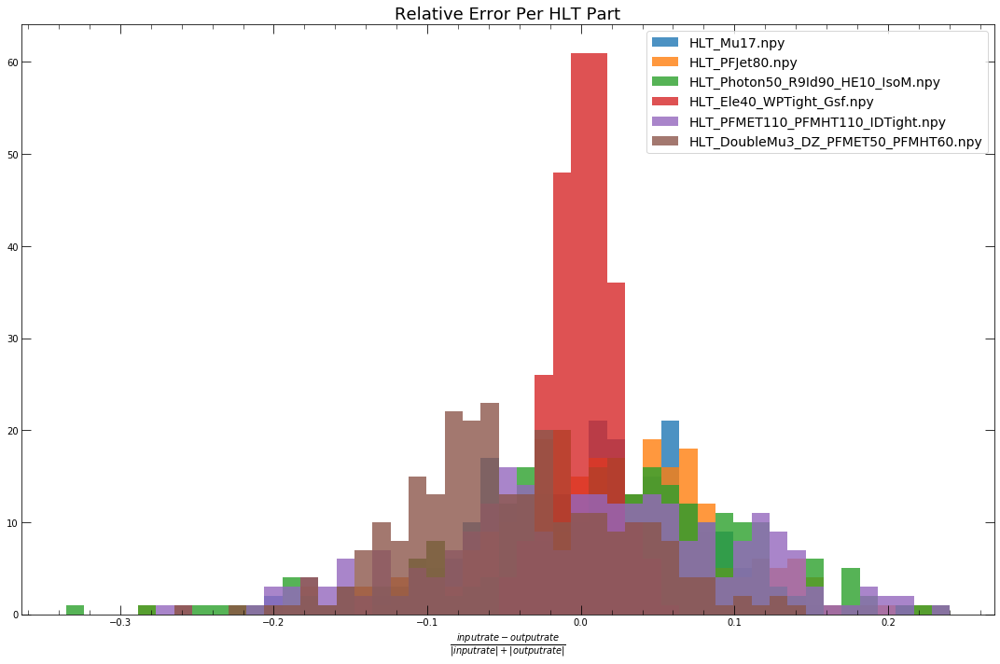

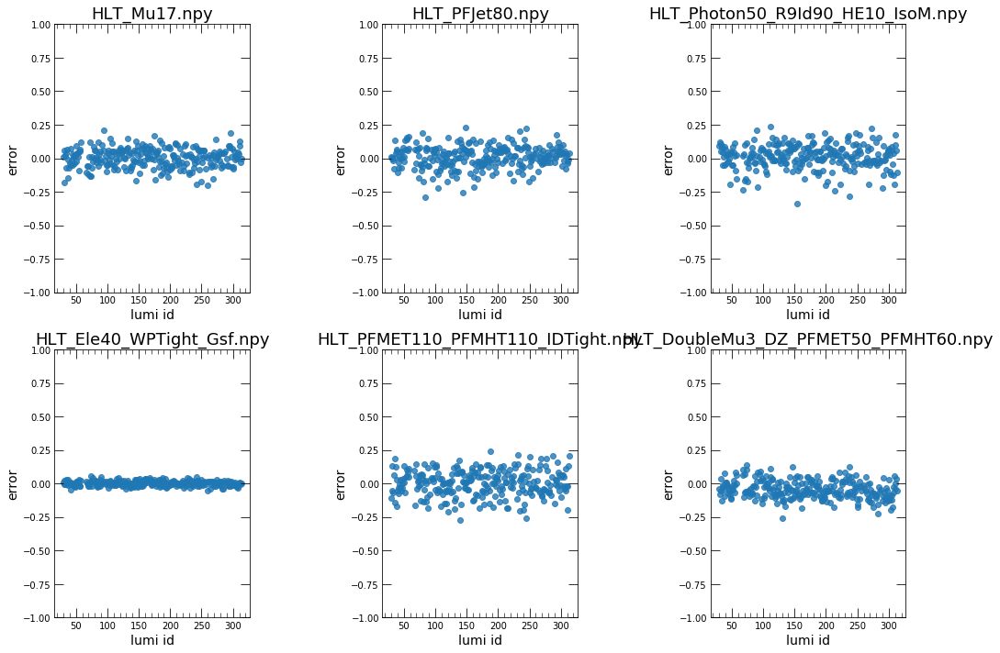

<h2>Plotting Inputs vs Outputs</h2>

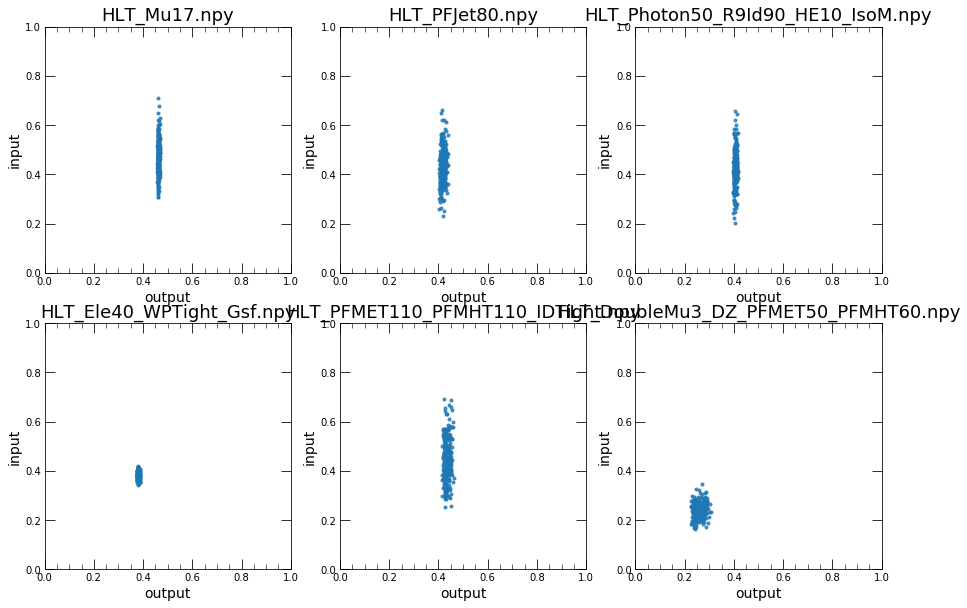

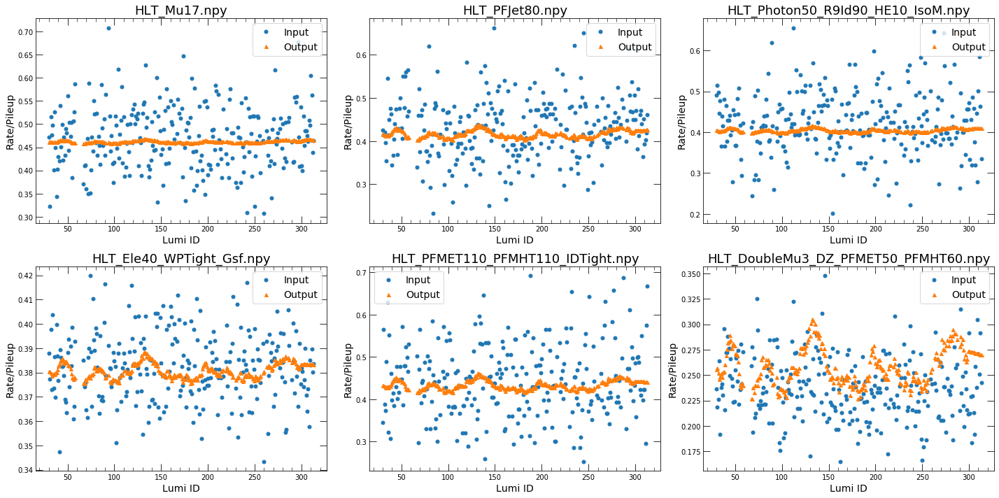

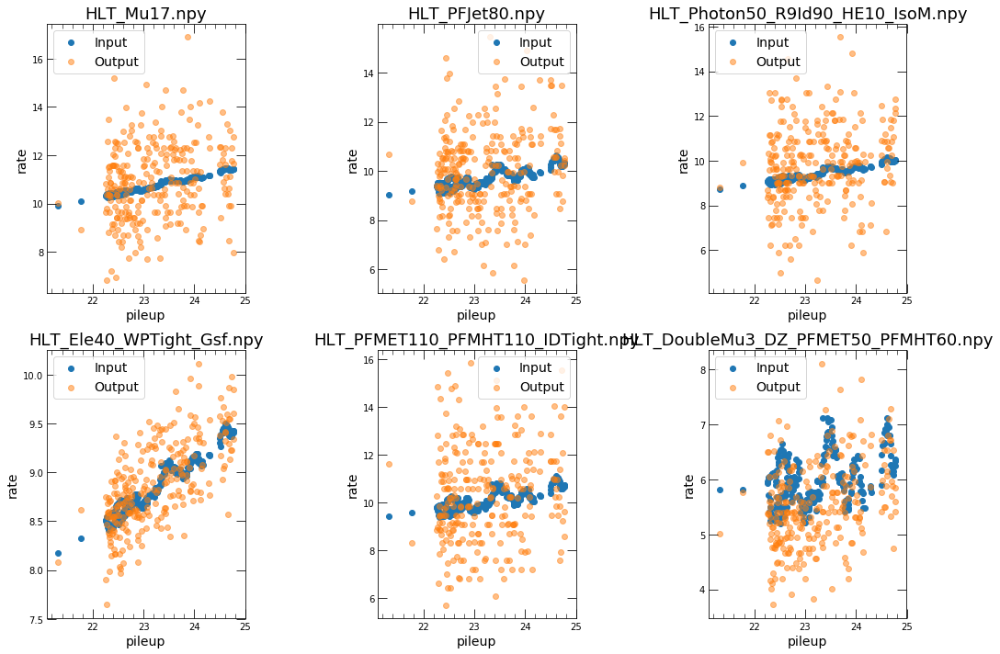

<h1>300240</h1>

<h2>Displaying Inputs</h2>

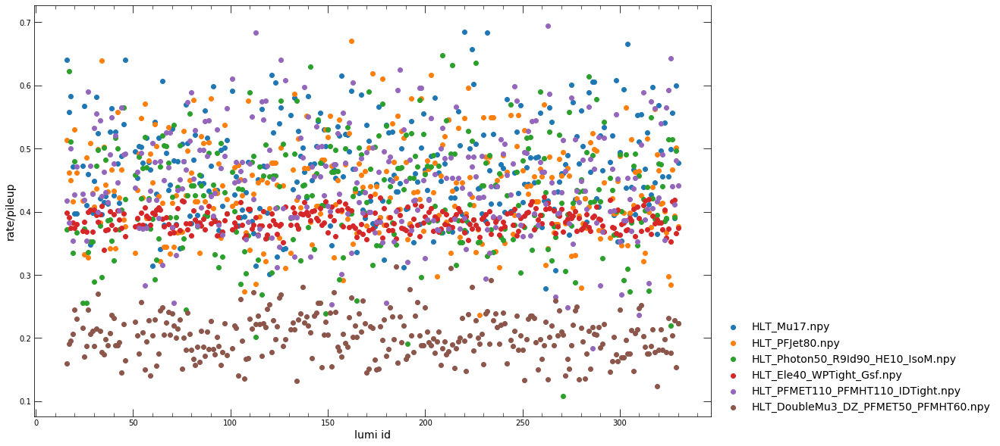

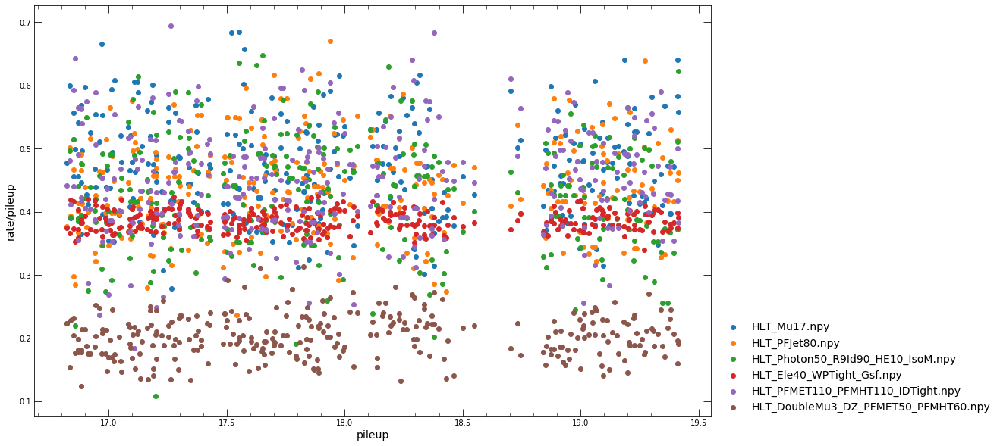

<h2>Plotting Errors</h2>

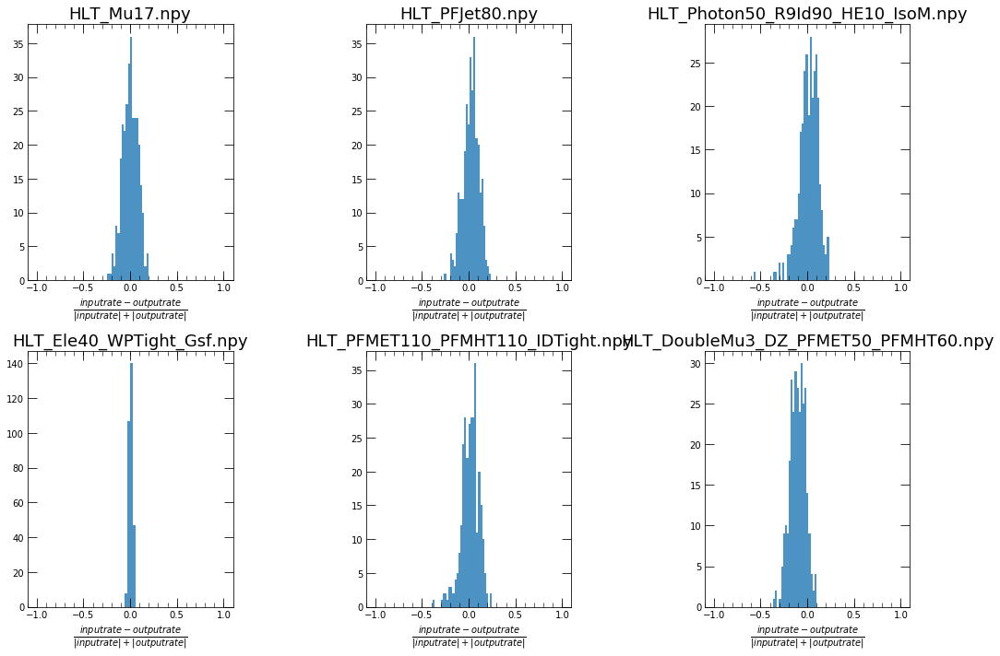

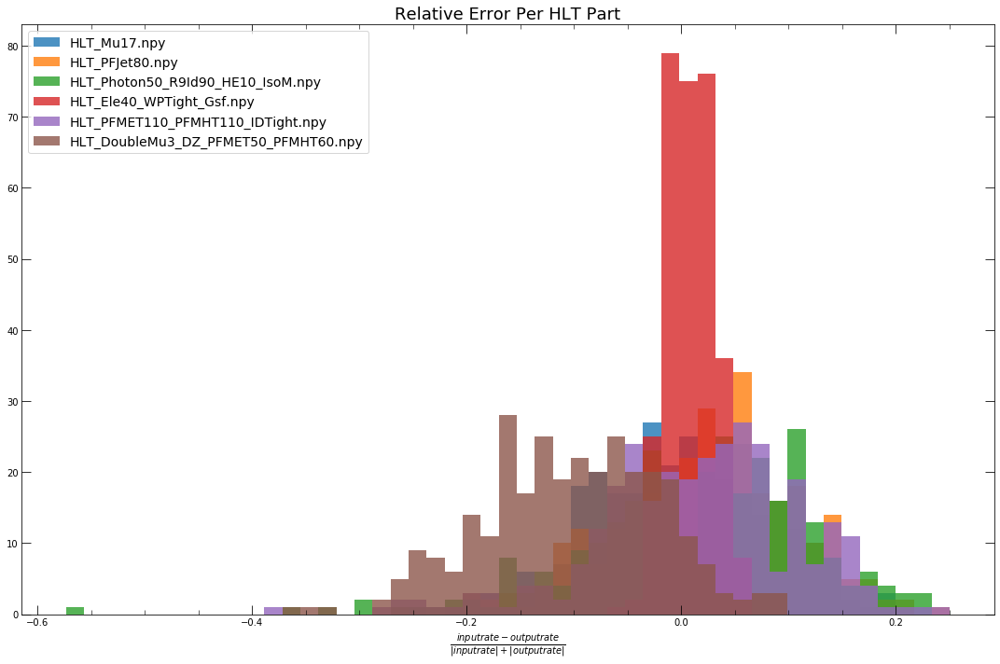

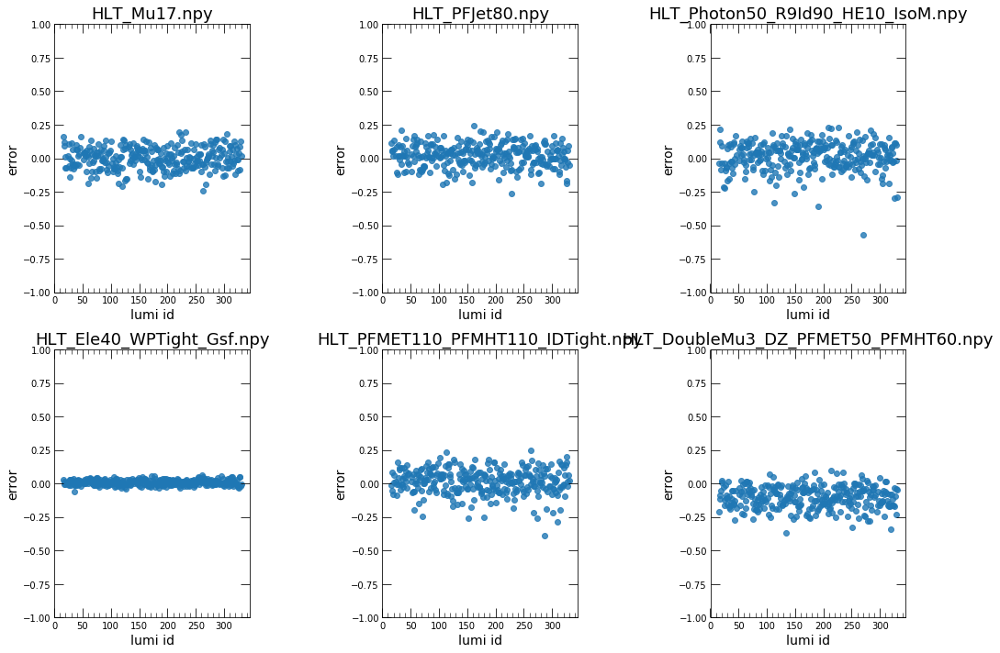

<h2>Plotting Inputs vs Outputs</h2>

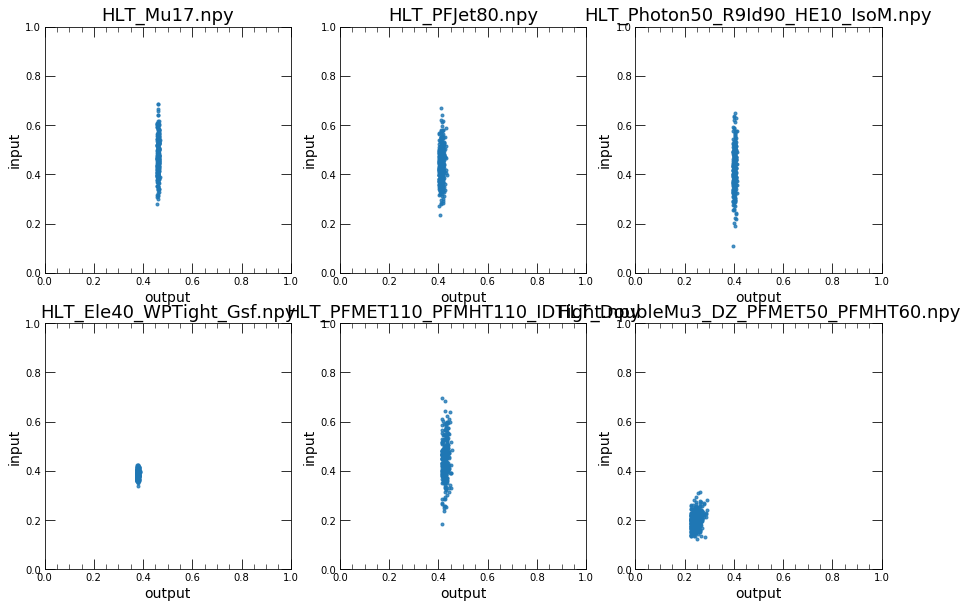

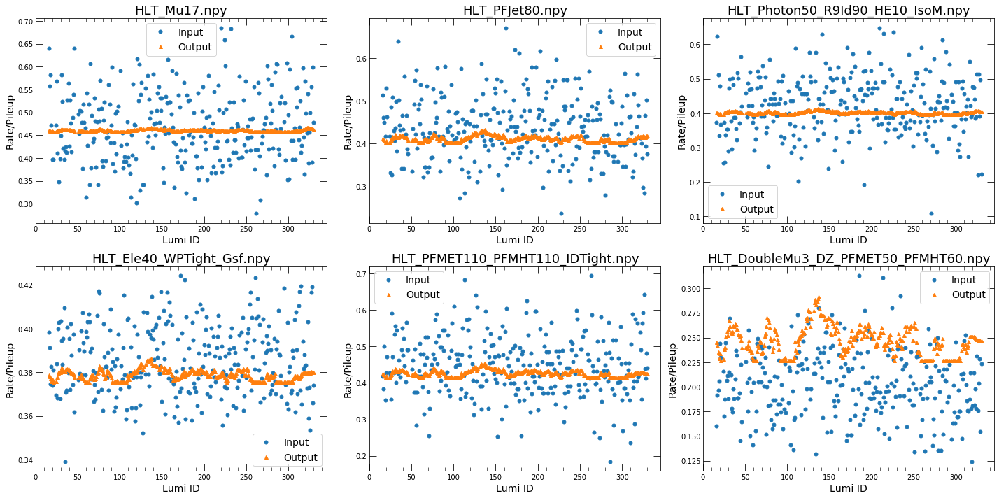

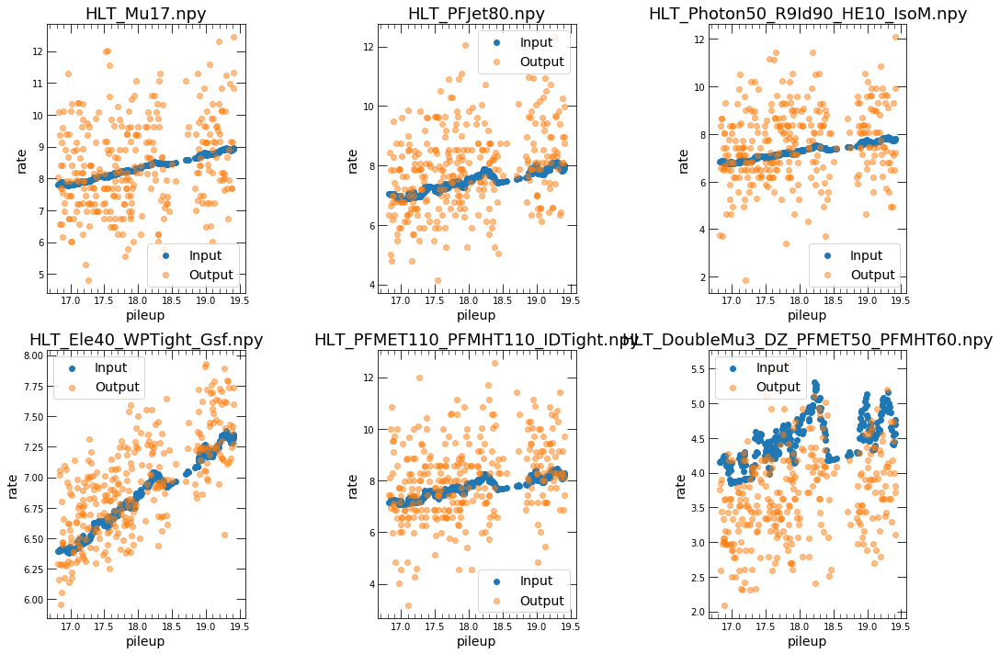

<h1>300280</h1>

<h2>Displaying Inputs</h2>

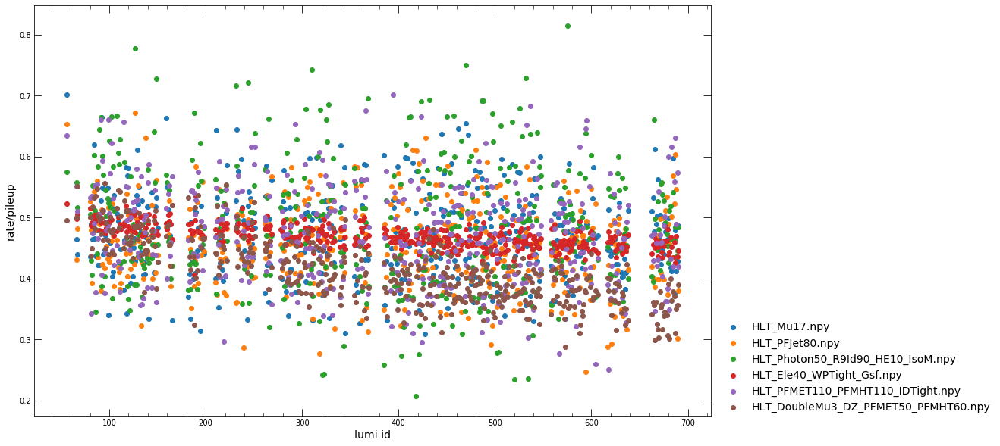

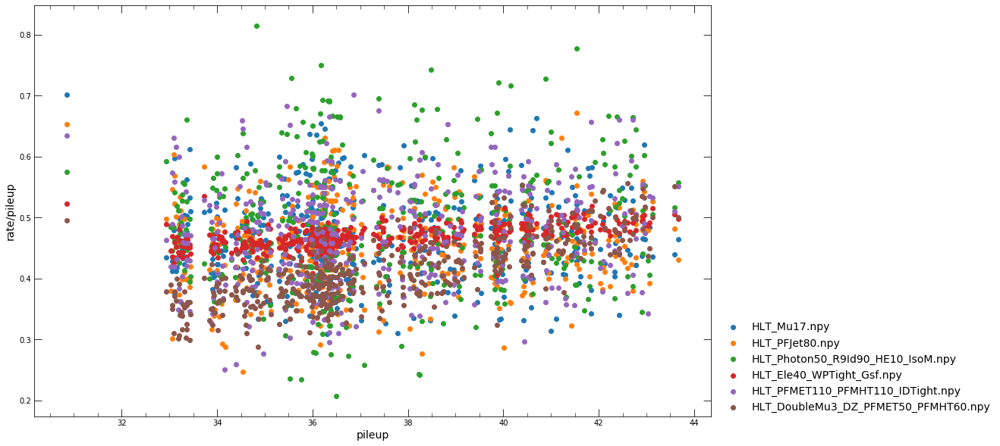

<h2>Plotting Errors</h2>

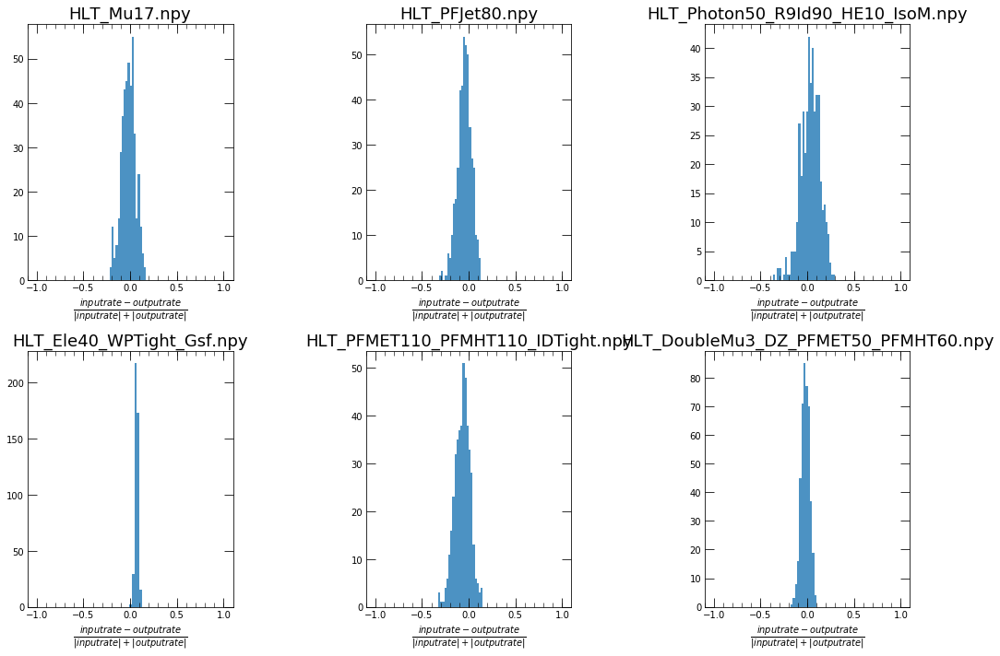

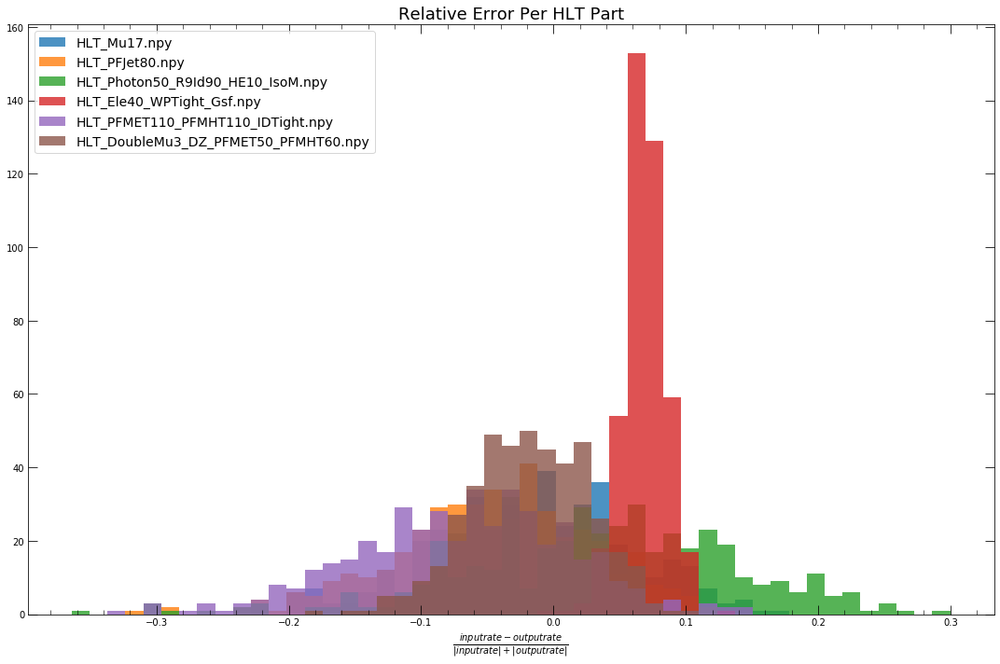

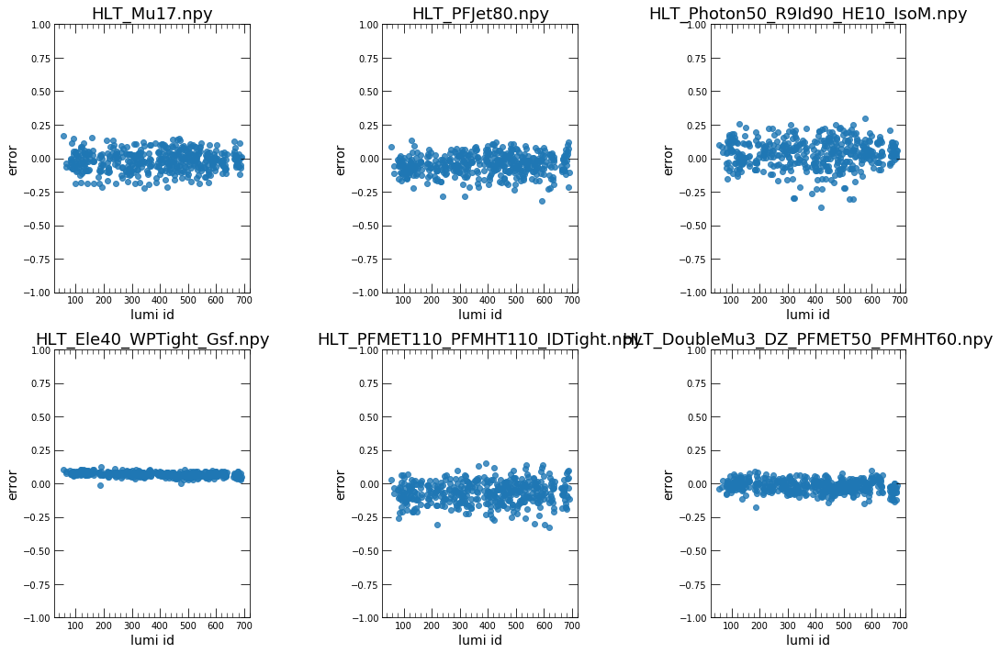

<h2>Plotting Inputs vs Outputs</h2>

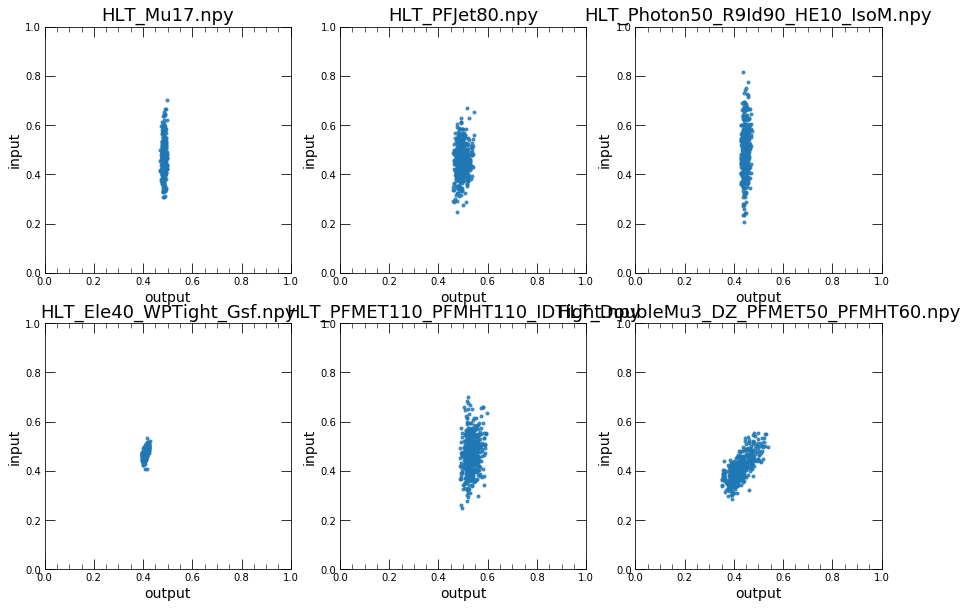

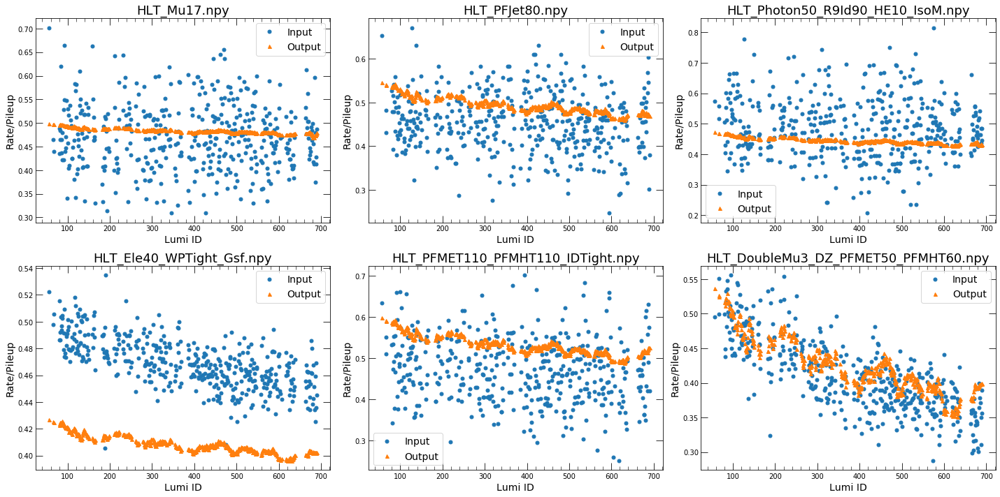

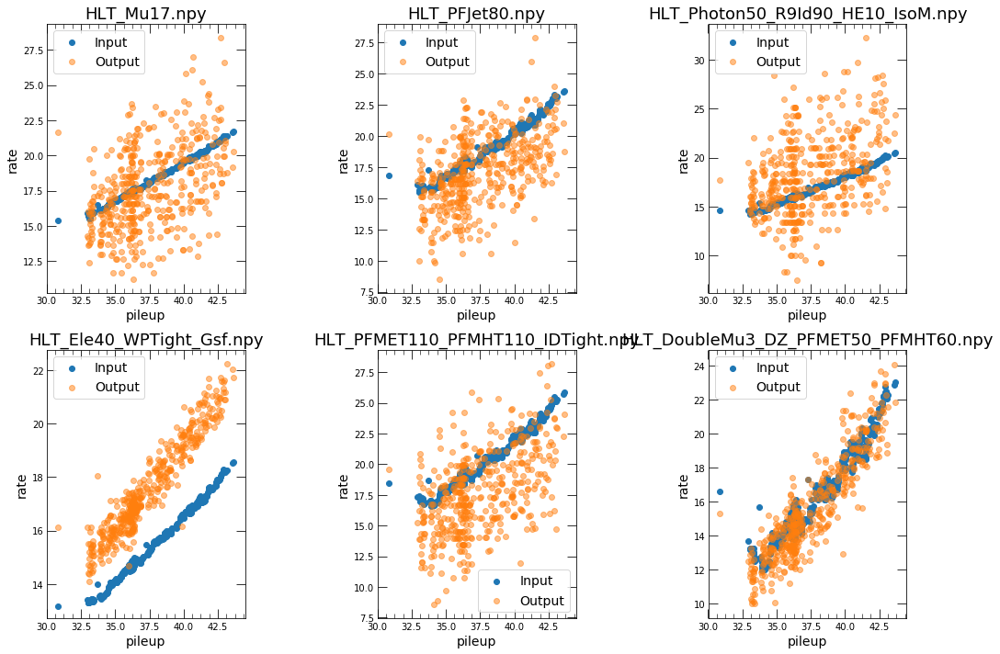

<h1>300284</h1>

<h2>Displaying Inputs</h2>

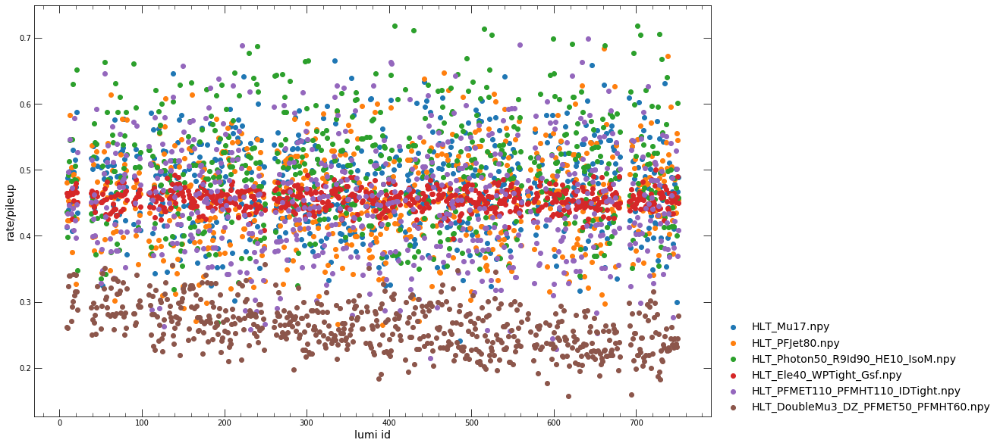

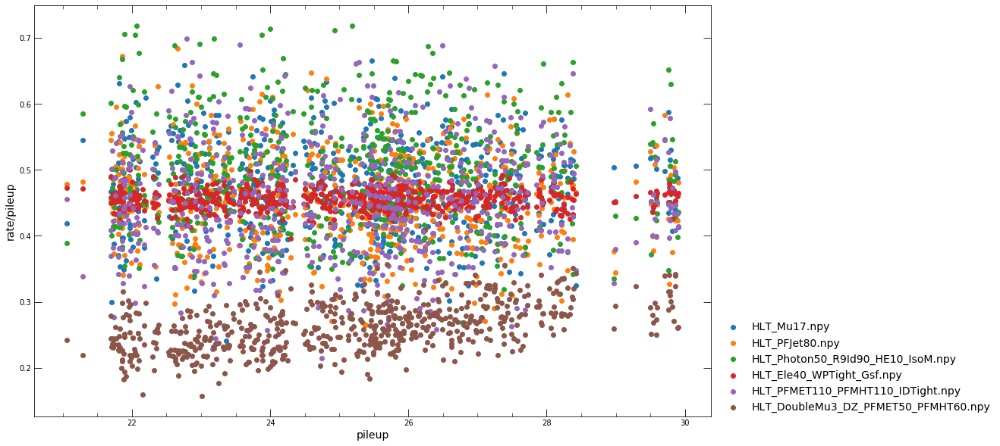

<h2>Plotting Errors</h2>

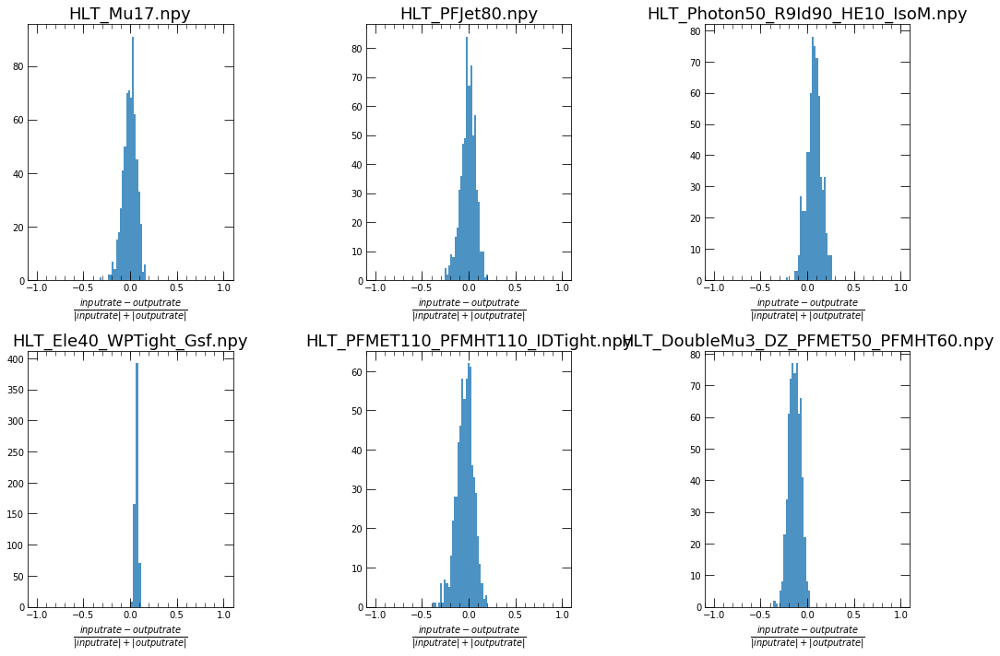

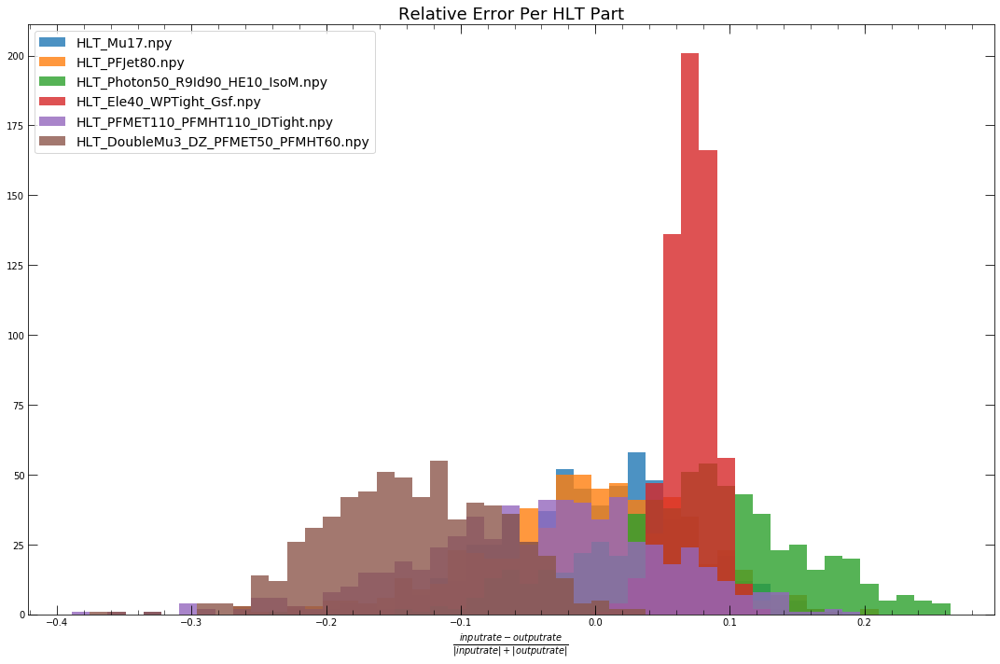

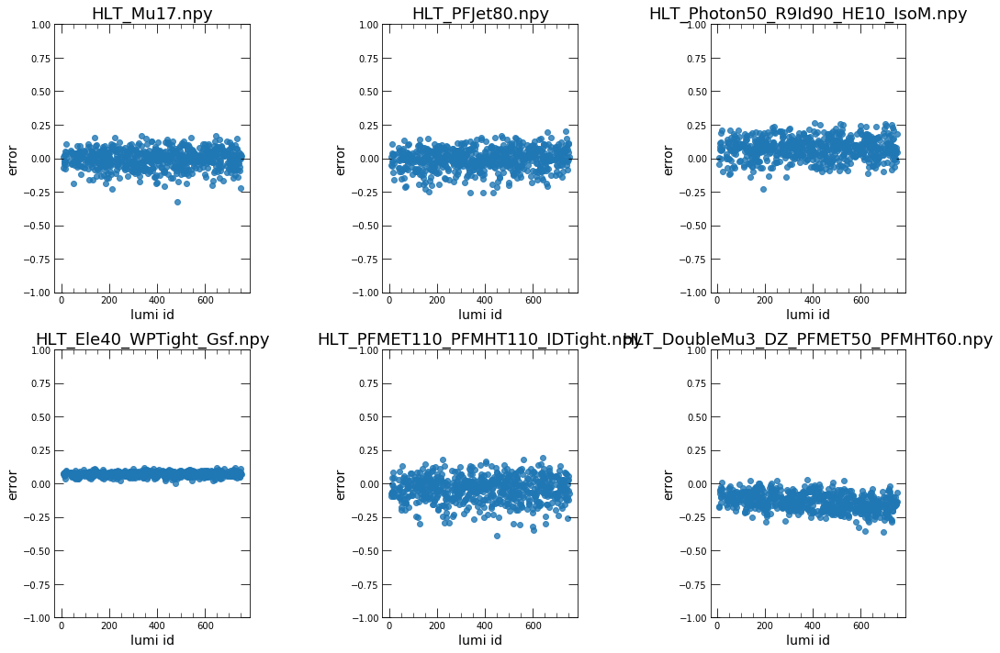

<h2>Plotting Inputs vs Outputs</h2>

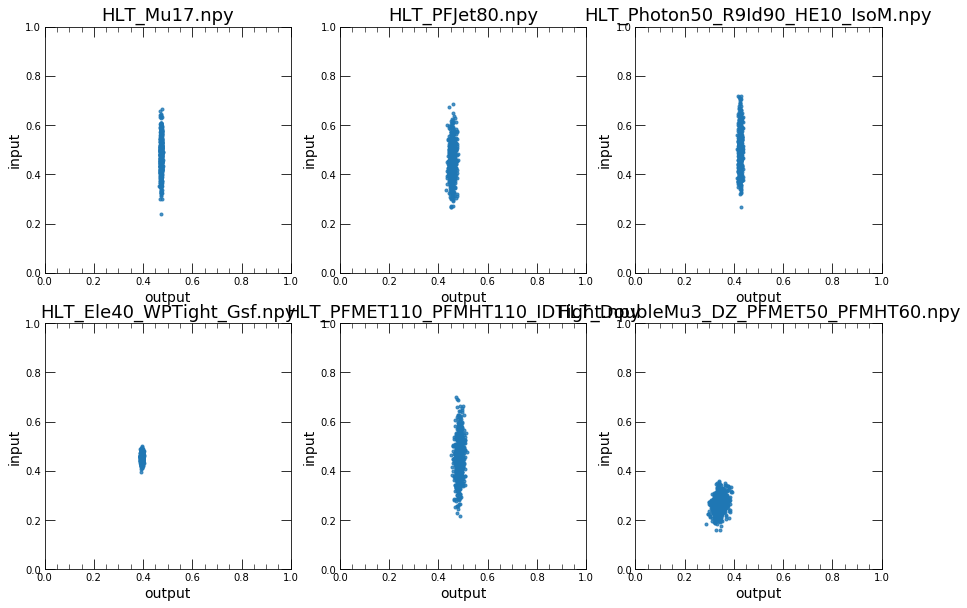

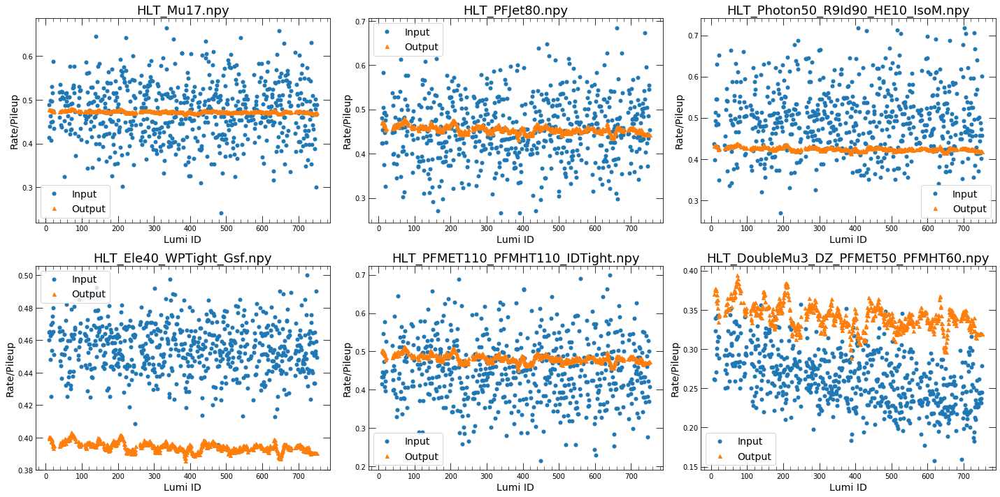

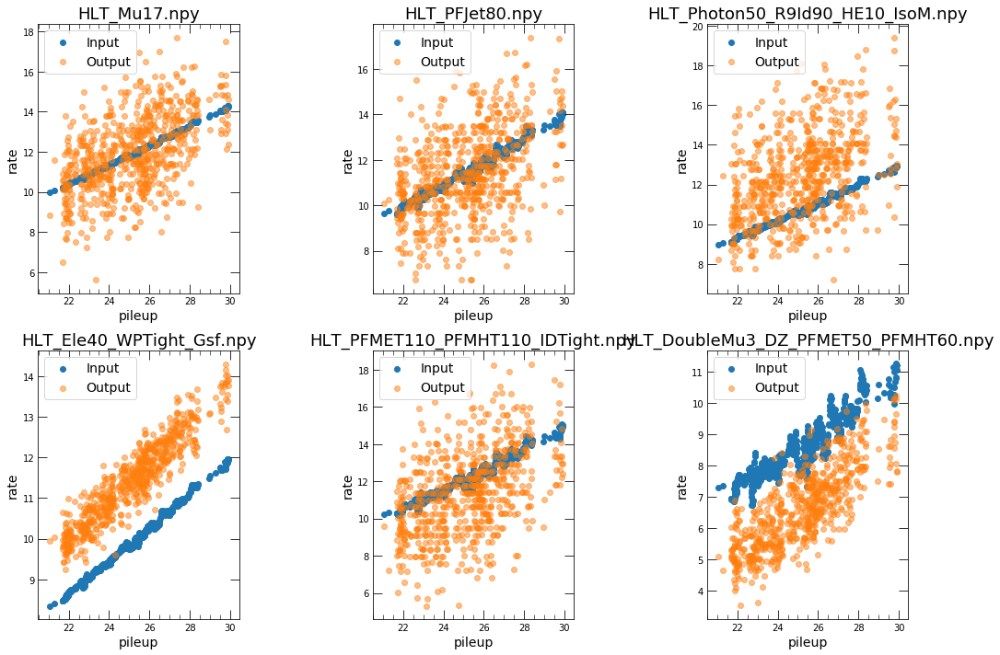

<h1>300237</h1>

<h2>Displaying Inputs</h2>

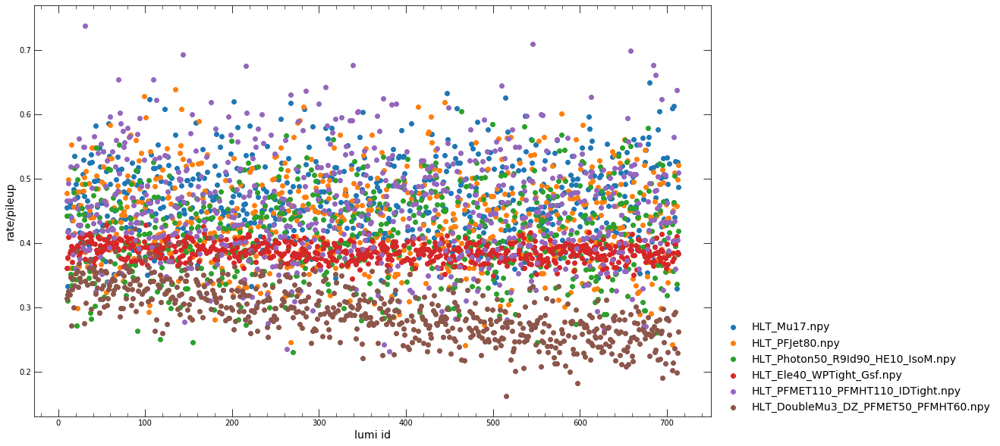

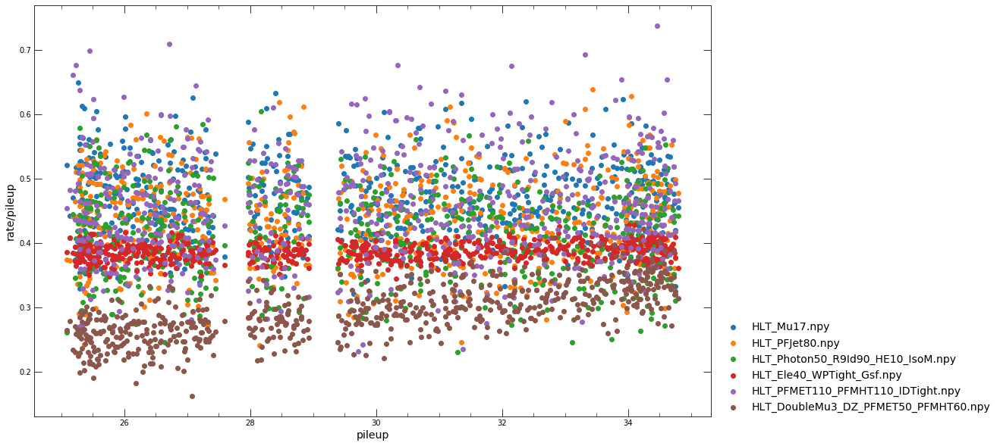

<h2>Plotting Errors</h2>

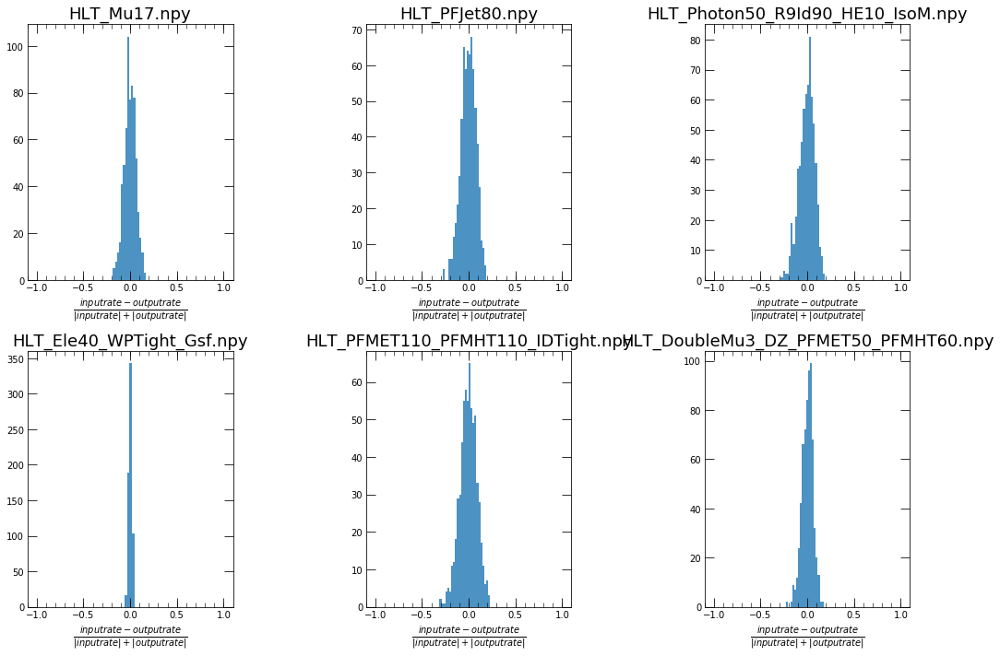

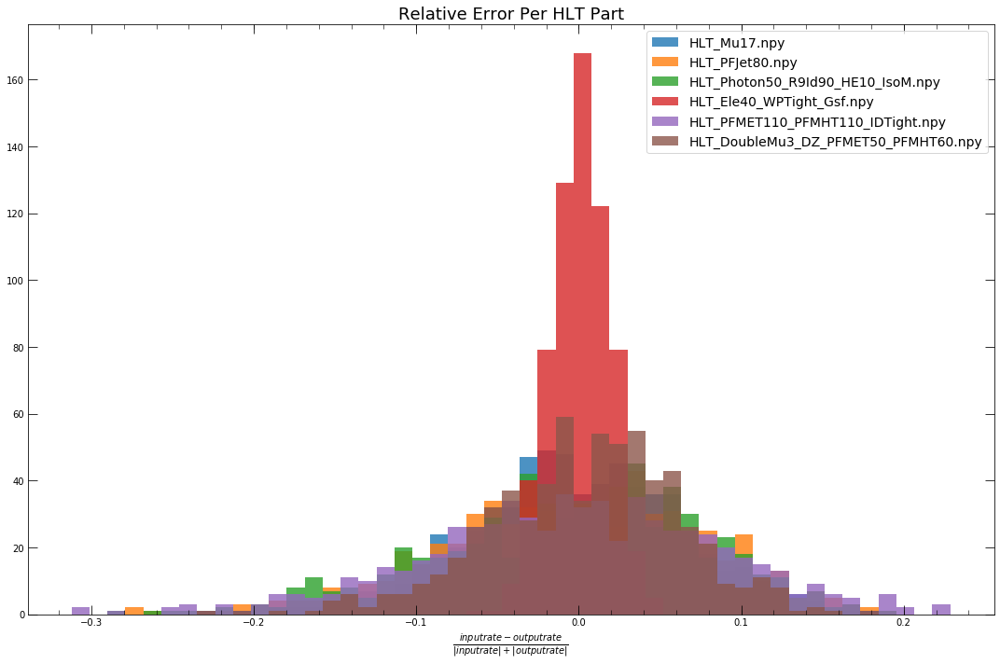

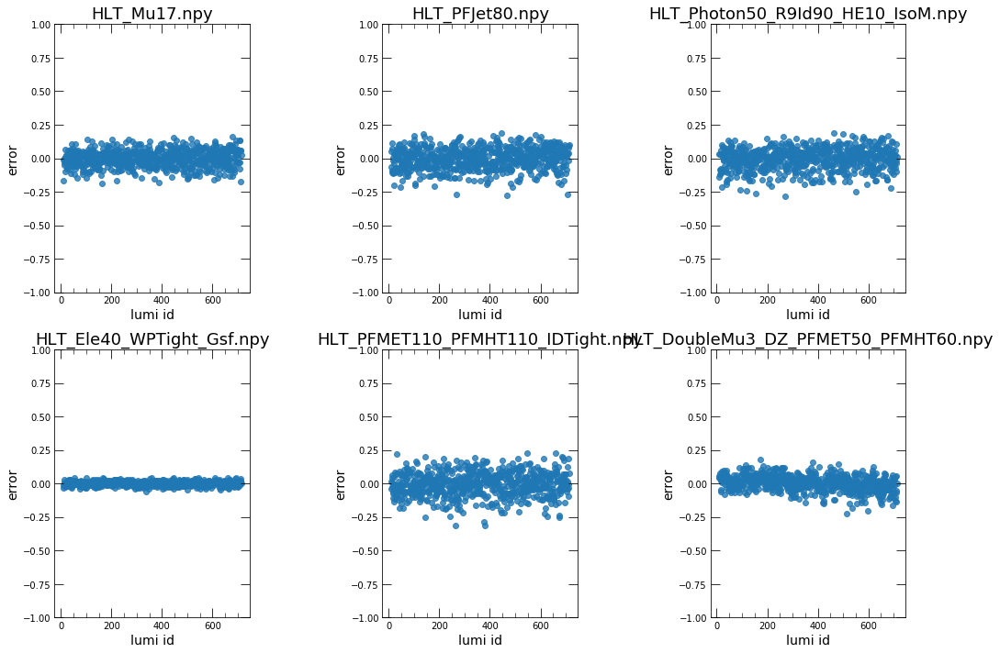

<h2>Plotting Inputs vs Outputs</h2>

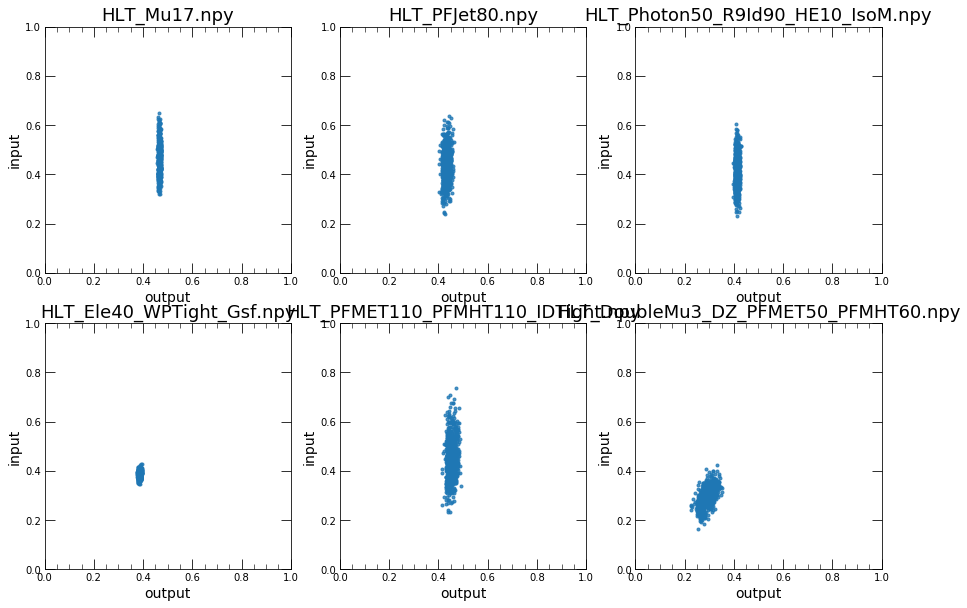

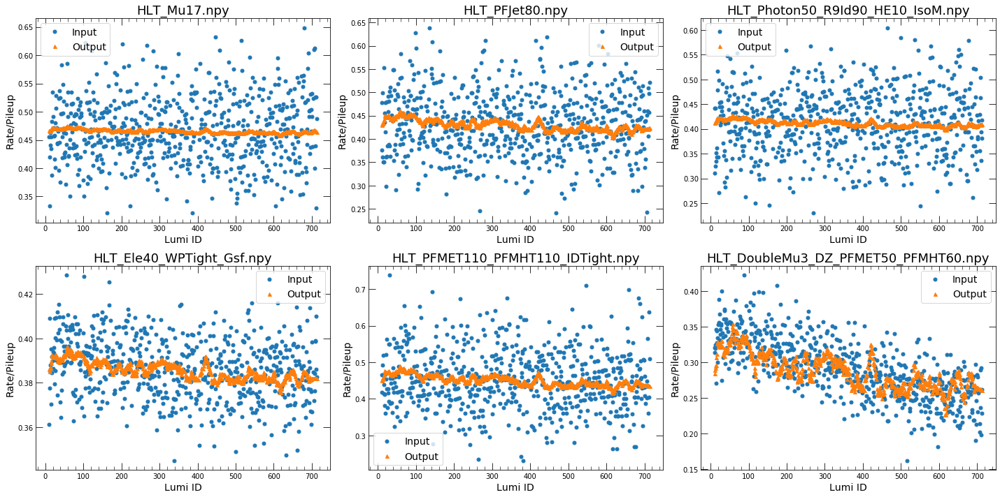

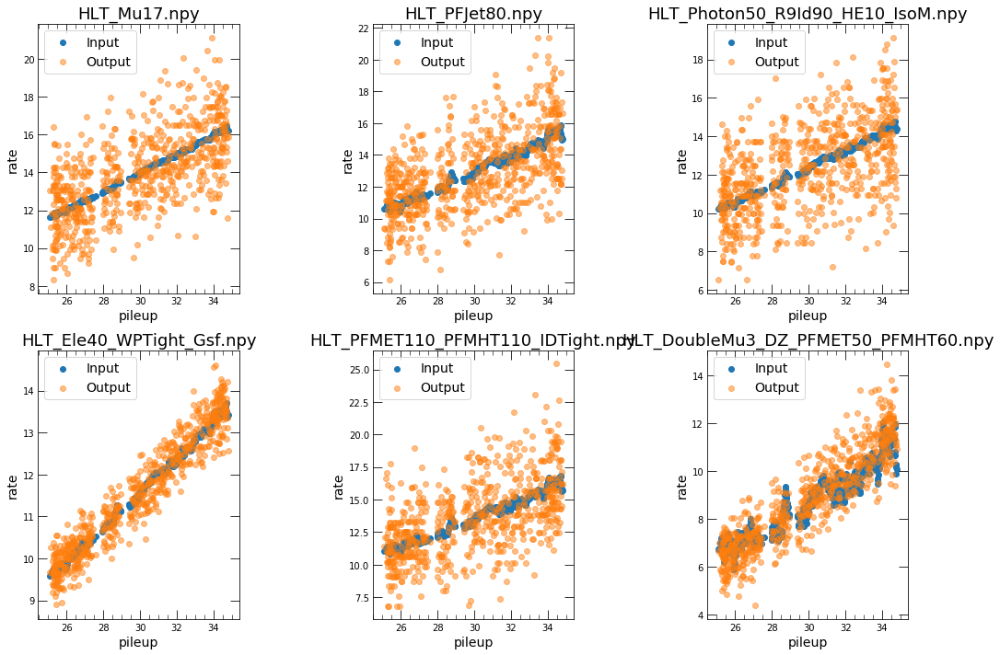

In [23]:
analyze_era('eraV211',good_data)

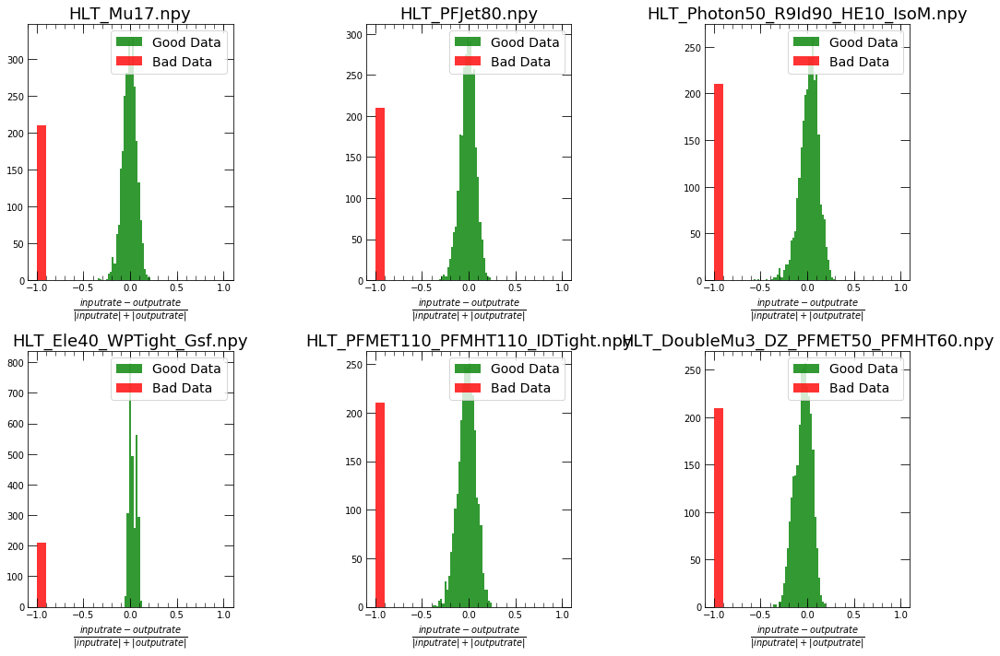

In [24]:
compare_good_bad('eraV211',good_data,bad_data)

<h1>eraV213</h1>

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           (None, 90)                0         
_________________________________________________________________
middle (Dense)               (None, 45)                4095      
_________________________________________________________________
batch_normalization_21 (Batc (None, 45)                180       
_________________________________________________________________
encoded (Dense)              (None, 3)                 138       
_________________________________________________________________
batch_normalization_22 (Batc (None, 3)                 12        
_________________________________________________________________
middle2 (Dense)              (None, 45)                180       
_________________________________________________________________
batch_normalization_23 (Batc (None, 45)                180       
__________

 - 0s - loss: 0.2175 - val_loss: 0.0513
Epoch 106/1000
 - 0s - loss: 0.2137 - val_loss: 0.0507
Epoch 107/1000
 - 0s - loss: 0.2100 - val_loss: 0.0498
Epoch 108/1000
 - 0s - loss: 0.2063 - val_loss: 0.0491
Epoch 109/1000
 - 0s - loss: 0.2027 - val_loss: 0.0486
Epoch 110/1000
 - 0s - loss: 0.1991 - val_loss: 0.0481
Epoch 111/1000
 - 0s - loss: 0.1956 - val_loss: 0.0476
Epoch 112/1000
 - 0s - loss: 0.1921 - val_loss: 0.0473
Epoch 113/1000
 - 0s - loss: 0.1887 - val_loss: 0.0469
Epoch 114/1000
 - 0s - loss: 0.1854 - val_loss: 0.0466
Epoch 115/1000
 - 0s - loss: 0.1821 - val_loss: 0.0464
Epoch 116/1000
 - 0s - loss: 0.1789 - val_loss: 0.0462
Epoch 117/1000
 - 0s - loss: 0.1757 - val_loss: 0.0459
Epoch 118/1000
 - 0s - loss: 0.1725 - val_loss: 0.0457
Epoch 119/1000
 - 0s - loss: 0.1694 - val_loss: 0.0456
Epoch 120/1000
 - 0s - loss: 0.1664 - val_loss: 0.0454
Epoch 121/1000
 - 0s - loss: 0.1634 - val_loss: 0.0452
Epoch 122/1000
 - 0s - loss: 0.1605 - val_loss: 0.0451
Epoch 123/1000
 - 0s - lo

 - 0s - loss: 0.0124 - val_loss: 0.0177
Epoch 255/1000
 - 0s - loss: 0.0122 - val_loss: 0.0175
Epoch 256/1000
 - 0s - loss: 0.0120 - val_loss: 0.0172
Epoch 257/1000
 - 0s - loss: 0.0118 - val_loss: 0.0170
Epoch 258/1000
 - 0s - loss: 0.0116 - val_loss: 0.0167
Epoch 259/1000
 - 0s - loss: 0.0114 - val_loss: 0.0165
Epoch 260/1000
 - 0s - loss: 0.0112 - val_loss: 0.0162
Epoch 261/1000
 - 0s - loss: 0.0110 - val_loss: 0.0160
Epoch 262/1000
 - 0s - loss: 0.0109 - val_loss: 0.0158
Epoch 263/1000
 - 0s - loss: 0.0107 - val_loss: 0.0155
Epoch 264/1000
 - 0s - loss: 0.0105 - val_loss: 0.0153
Epoch 265/1000
 - 0s - loss: 0.0104 - val_loss: 0.0151
Epoch 266/1000
 - 0s - loss: 0.0102 - val_loss: 0.0149
Epoch 267/1000
 - 0s - loss: 0.0101 - val_loss: 0.0146
Epoch 268/1000
 - 0s - loss: 0.0099 - val_loss: 0.0144
Epoch 269/1000
 - 0s - loss: 0.0098 - val_loss: 0.0142
Epoch 270/1000
 - 0s - loss: 0.0096 - val_loss: 0.0140
Epoch 271/1000
 - 0s - loss: 0.0095 - val_loss: 0.0138
Epoch 272/1000
 - 0s - lo

Epoch 404/1000
 - 0s - loss: 0.0047 - val_loss: 0.0054
Epoch 405/1000
 - 0s - loss: 0.0047 - val_loss: 0.0054
Epoch 406/1000
 - 0s - loss: 0.0047 - val_loss: 0.0054
Epoch 407/1000
 - 0s - loss: 0.0047 - val_loss: 0.0054
Epoch 408/1000
 - 0s - loss: 0.0047 - val_loss: 0.0054
Epoch 409/1000
 - 0s - loss: 0.0047 - val_loss: 0.0054
Epoch 410/1000
 - 0s - loss: 0.0047 - val_loss: 0.0054
Epoch 411/1000
 - 0s - loss: 0.0047 - val_loss: 0.0054
Epoch 412/1000
 - 0s - loss: 0.0047 - val_loss: 0.0054
Epoch 413/1000
 - 0s - loss: 0.0047 - val_loss: 0.0054
Epoch 414/1000
 - 0s - loss: 0.0047 - val_loss: 0.0054
Epoch 415/1000
 - 0s - loss: 0.0047 - val_loss: 0.0054
Epoch 416/1000
 - 0s - loss: 0.0047 - val_loss: 0.0054
Epoch 417/1000
 - 0s - loss: 0.0047 - val_loss: 0.0054
Epoch 418/1000
 - 0s - loss: 0.0047 - val_loss: 0.0054
Epoch 419/1000
 - 0s - loss: 0.0047 - val_loss: 0.0054
Epoch 420/1000
 - 0s - loss: 0.0047 - val_loss: 0.0054
Epoch 421/1000
 - 0s - loss: 0.0047 - val_loss: 0.0054
Epoch 422/

Epoch 553/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 554/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 555/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 556/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 557/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 558/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 559/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 560/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 561/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 562/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 563/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 564/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 565/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 566/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 567/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 568/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 569/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 570/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 571/

Epoch 702/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 703/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 704/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 705/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 706/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 707/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 708/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 709/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 710/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 711/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 712/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 713/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 714/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 715/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 716/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 717/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 718/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 719/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 720/

Epoch 851/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 852/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 853/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 854/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 855/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 856/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 857/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 858/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 859/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 860/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 861/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 862/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 863/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 864/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 865/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 866/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 867/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 868/1000
 - 0s - loss: 0.0046 - val_loss: 0.0052
Epoch 869/

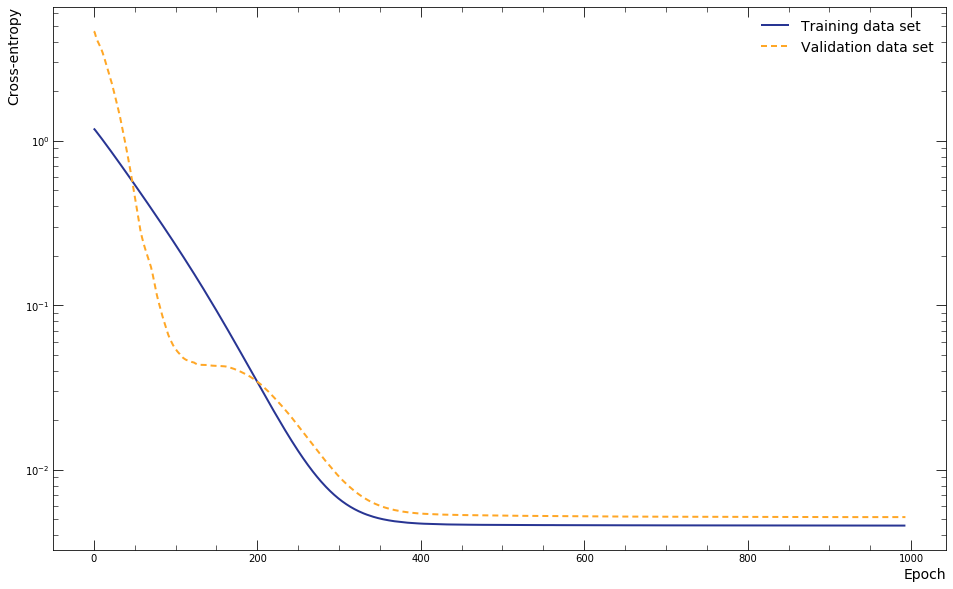

<h1>300675</h1>

<h1>300632</h1>

<h1>300674</h1>

<h1>300676</h1>

<h1>300812</h1>

<h1>300575</h1>

<h1>300574</h1>

<h1>300461</h1>

<h1>300462</h1>

OSError: Unable to open file (file signature not found)

In [27]:
analyze_era('eraV213',good_data)

In [ ]:
compare_good_bad('eraV212',good_data,bad_data)

In [ ]:
analyze_era('eraV300',good_data)

In [ ]:
compare_good_bad('eraV300',good_data,bad_data)

In [ ]:
for era in good_data["Eras"].keys():
    analyze_era(era,good_data)
    compare_good_bad(era,good_data,bad_data)

In [ ]:
print(good_data["Eras"].keys())